<a href="https://colab.research.google.com/github/Gideon-Weasley/Pytorch_tutorial/blob/main/Copy_of_NeRF_Workshop.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

In [ ]:
!gdown 1zJ1gQC97E-RWQ8q3L8sHg9CwFUmjd6c-

Downloading...
From: https://drive.google.com/uc?id=1zJ1gQC97E-RWQ8q3L8sHg9CwFUmjd6c-
To: /content/tiny_nerf_data.npz
100% 12.7M/12.7M [00:00<00:00, 58.1MB/s]


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.set_default_dtype(torch.float32)

In [ ]:
L_embed = 6

## NeRF Model Instructions

## 1. Number of Layers:
##    - The model consists of three fully connected (linear) layers.

## 2. Input Size:
##    - The input includes 3D coordinates (x, y, z).
##    - Positional encoding expands the input dimension.
##    - The final input size is 3 + 3 * 2 * L_embed.

## 3. Hidden Layers:
##    - The first hidden layer maps the input to a feature space of size `filter_size`.
##    - The second hidden layer maintains the same `filter_size` dimension.
##    - Use ReLU as the activation function after these layers.

## 4. Output Layer:
##    - The final layer outputs a 4D vector.
##    - This output typically represents RGB color (3 channels) and a density (1 channel).

class NeRF(torch.nn.Module):
    """
    NeRF MLP model
    """
    def __init__(self, filter_size=128, L_embed=6):
        super(NeRF, self).__init__()

    def forward(self, x):

        return x


In [ ]:
L_embed = 6

## NeRF Model Instructions

## 1. Number of Layers:
##    - The model consists of three fully connected (linear) layers.

## 2. Input Size:
##    - The input includes 3D coordinates (x, y, z).
##    - Positional encoding expands the input dimension.
##    - The final input size is 3 + 3 * 2 * L_embed.

## 3. Hidden Layers:
##    - The first hidden layer maps the input to a feature space of size `filter_size`.
##    - The second hidden layer maintains the same `filter_size` dimension.
##    - Use ReLU as the activation function after these layers.

## 4. Output Layer:
##    - The final layer outputs a 4D vector.
##    - This output typically represents RGB color (3 channels) and a density (1 channel).

class NeRF(torch.nn.Module):
    """
    NeRF MLP model
    """
    def __init__(self, filter_size=128, L_embed=6):
        super(NeRF, self).__init__()

    def forward(self, x):

        return x


In [ ]:
L_embed = 6

## NeRF Model Instructions

## 1. Number of Layers:
##    - The model consists of three fully connected (linear) layers.

## 2. Input Size:
##    - The input includes 3D coordinates (x, y, z).
##    - Positional encoding expands the input dimension.
##    - The final input size is 3 + 3 * 2 * L_embed.

## 3. Hidden Layers:
##    - The first hidden layer maps the input to a feature space of size `filter_size`.
##    - The second hidden layer maintains the same `filter_size` dimension.
##    - Use ReLU as the activation function after these layers.

## 4. Output Layer:
##    - The final layer outputs a 4D vector.
##    - This output typically represents RGB color (3 channels) and a density (1 channel).

class NeRF(torch.nn.Module):
    """
    NeRF MLP model
    """
    def __init__(self, filter_size=128, L_embed=6):
        super(NeRF, self).__init__()
        self.layer1 = torch.nn.Linear(3 + 3 * 2 * L_embed, filter_size)
        self.layer2 = torch.nn.Linear(filter_size, filter_size)
        self.layer3 = torch.nn.Linear(filter_size, 4)

    def forward(self, x):
        x=self.layer1(x)
        x=torch.nn.functional.relu(x)
        x=self.layer2(x)
        x=torch.nn.functional.relu(x)
        x=self.layer3(x)
        return x


NeRF optimization start


  0%|          | 0/10000 [00:00<?, ?it/s]

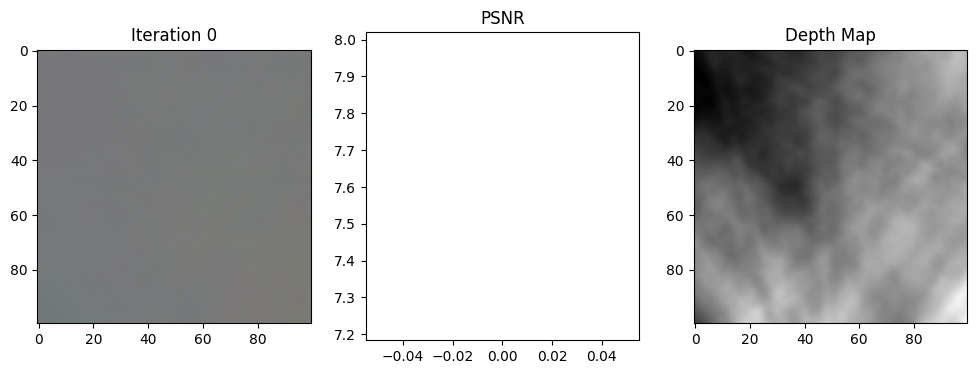

  1%|          | 99/10000 [00:09<11:58, 13.78it/s]

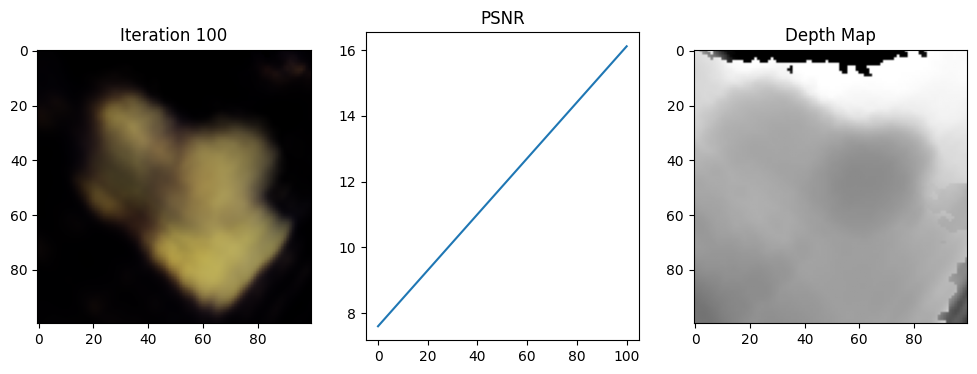

  2%|▏         | 199/10000 [00:18<12:36, 12.95it/s]

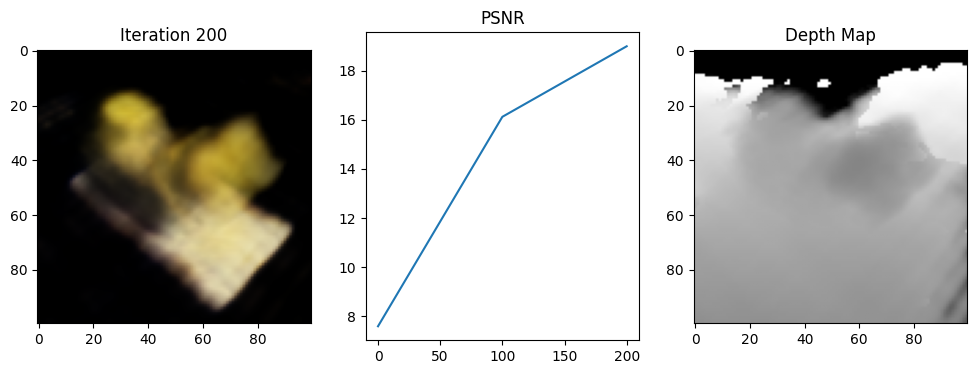

  3%|▎         | 299/10000 [00:27<11:48, 13.70it/s]

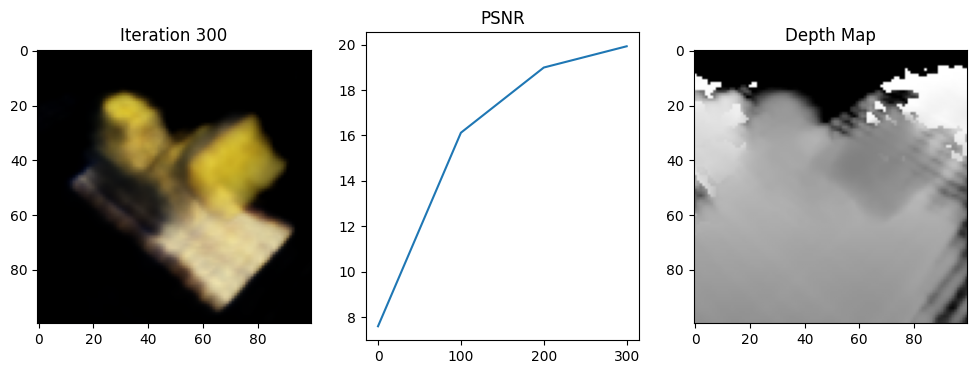

  4%|▍         | 399/10000 [00:35<11:39, 13.72it/s]

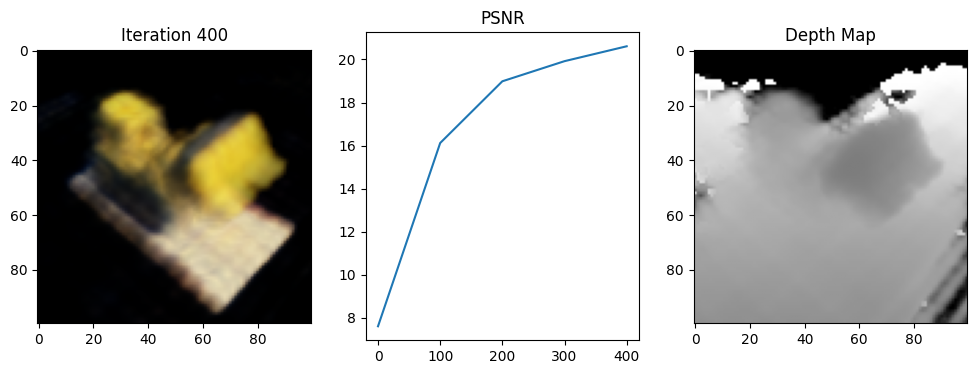

  5%|▍         | 499/10000 [00:44<11:33, 13.69it/s]

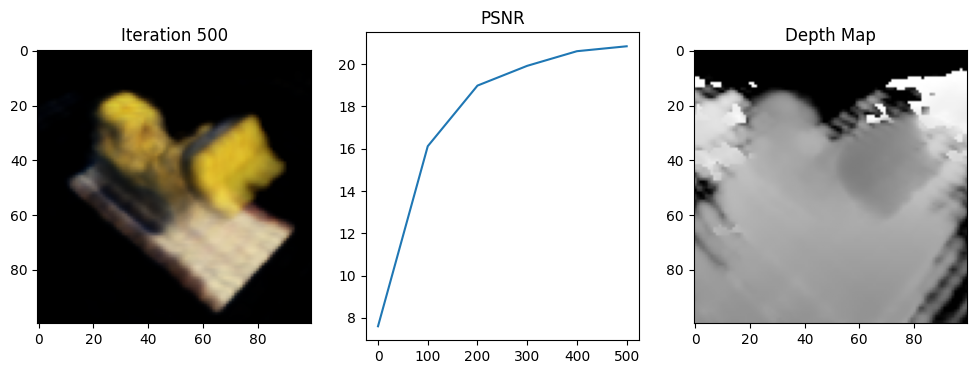

  6%|▌         | 599/10000 [00:53<11:29, 13.64it/s]

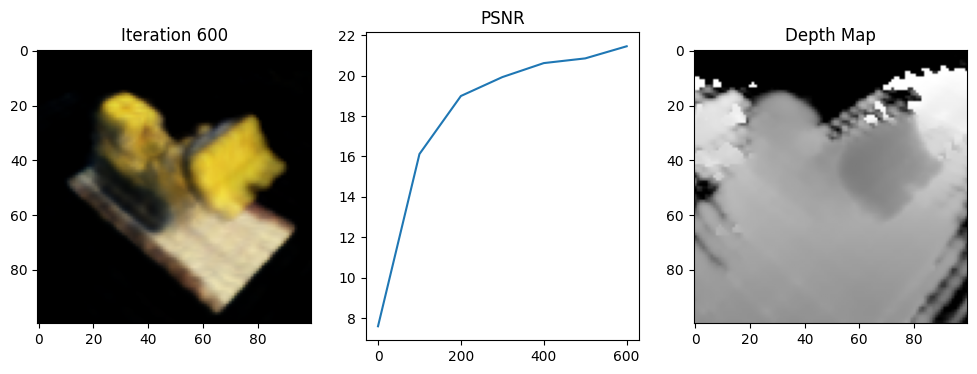

  7%|▋         | 699/10000 [01:02<11:23, 13.60it/s]

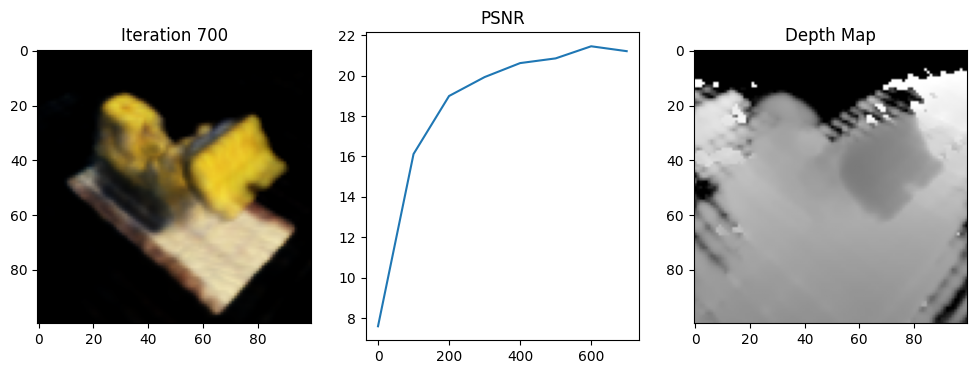

  8%|▊         | 799/10000 [01:11<11:11, 13.71it/s]

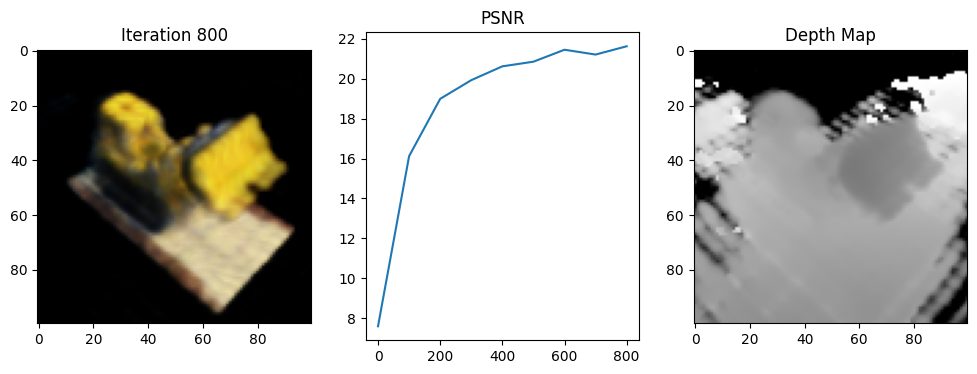

  9%|▉         | 899/10000 [01:20<11:41, 12.96it/s]

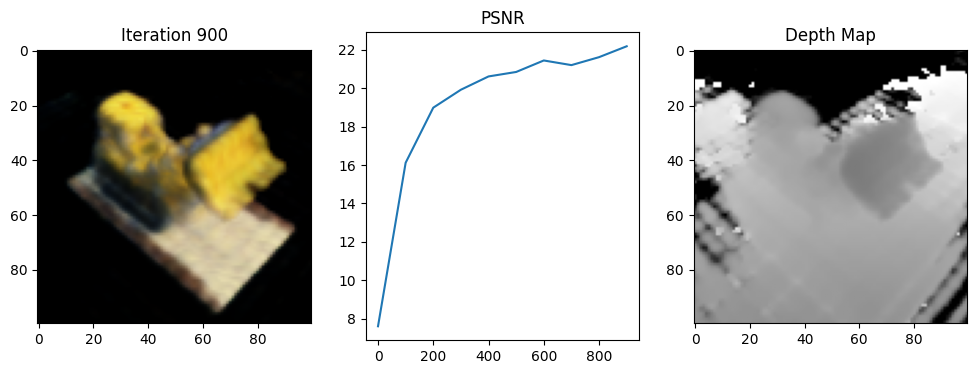

 10%|▉         | 999/10000 [01:28<11:01, 13.60it/s]

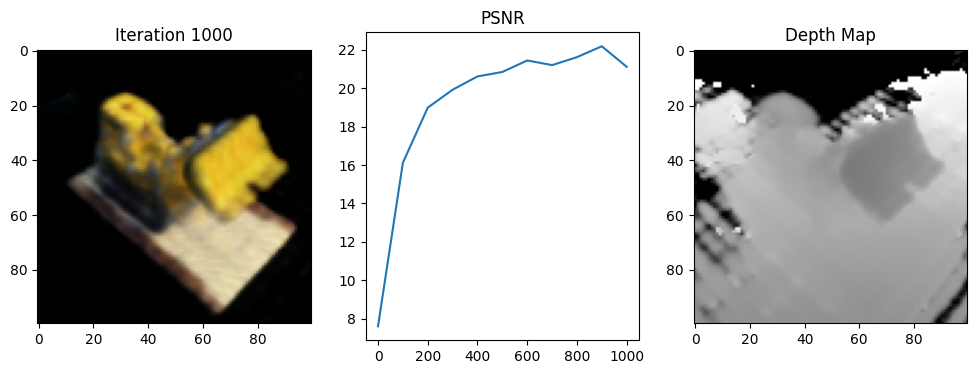

 11%|█         | 1099/10000 [01:37<10:53, 13.63it/s]

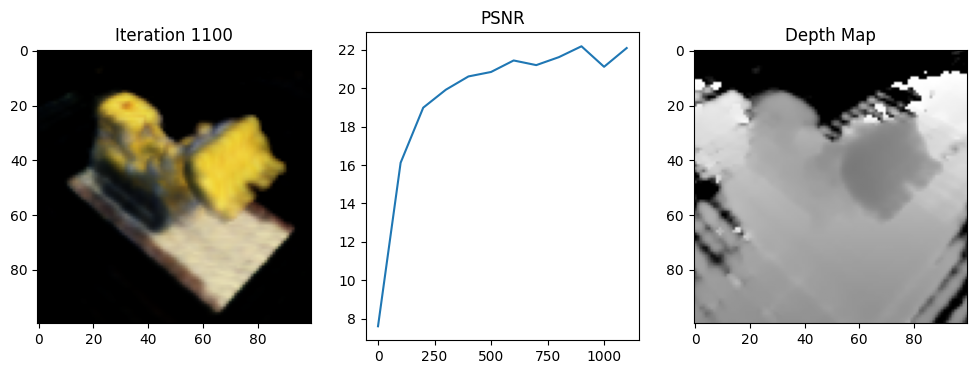

 12%|█▏        | 1199/10000 [01:46<10:48, 13.57it/s]

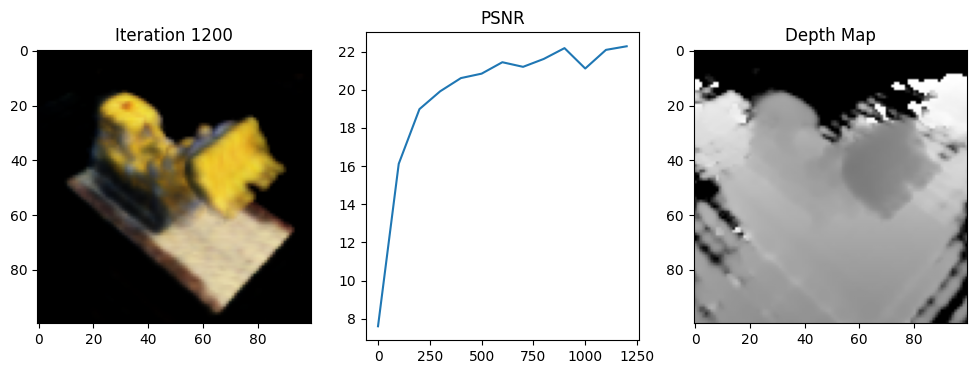

 13%|█▎        | 1299/10000 [01:55<10:58, 13.20it/s]

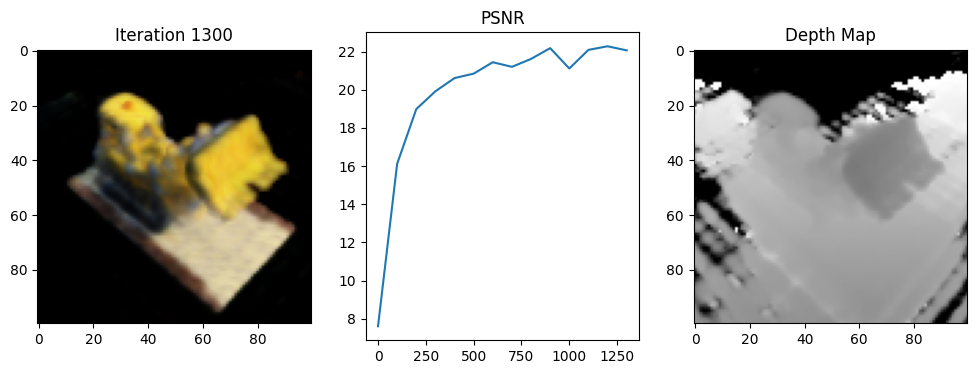

 14%|█▍        | 1399/10000 [02:04<10:36, 13.52it/s]

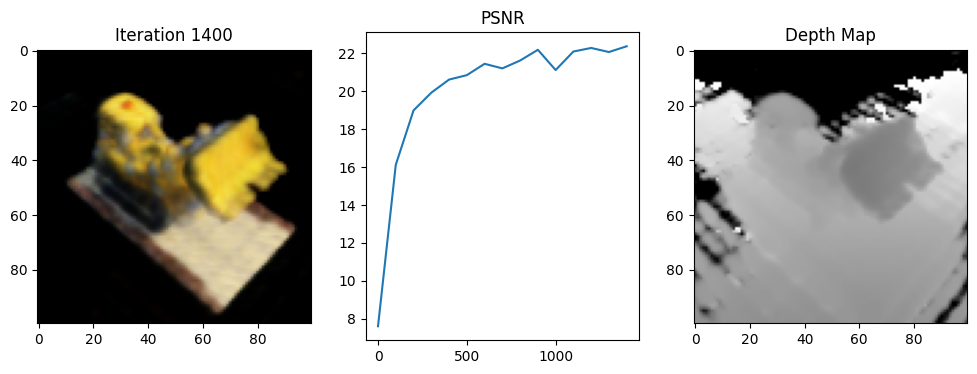

 15%|█▍        | 1499/10000 [02:13<10:32, 13.44it/s]

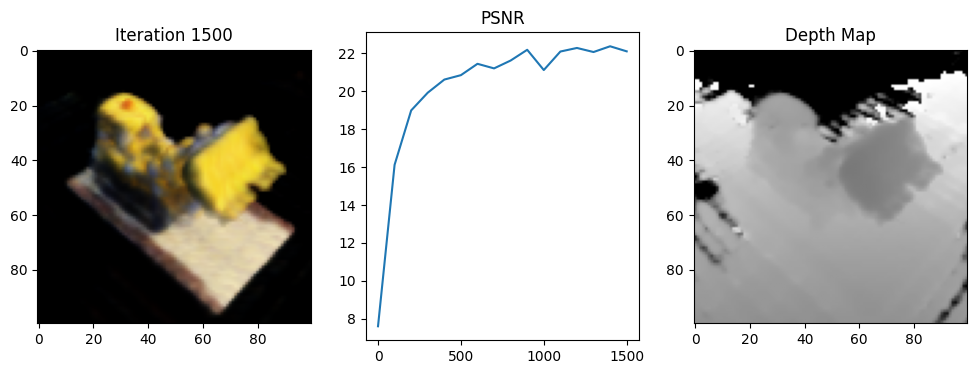

 16%|█▌        | 1599/10000 [02:22<10:53, 12.85it/s]

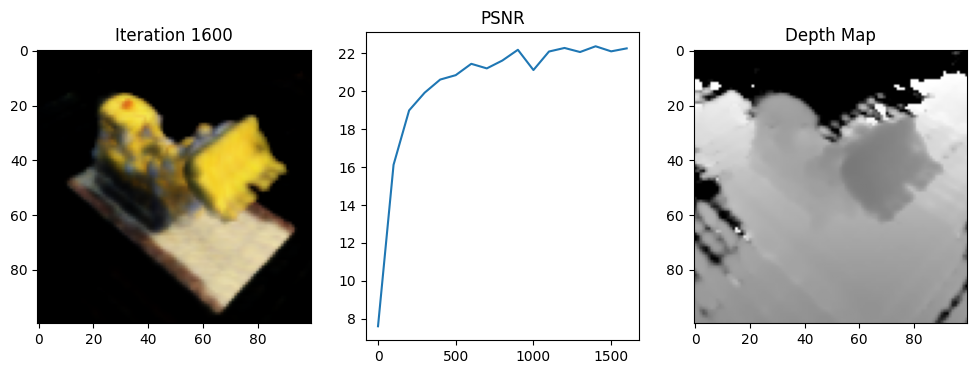

 17%|█▋        | 1699/10000 [02:31<10:22, 13.33it/s]

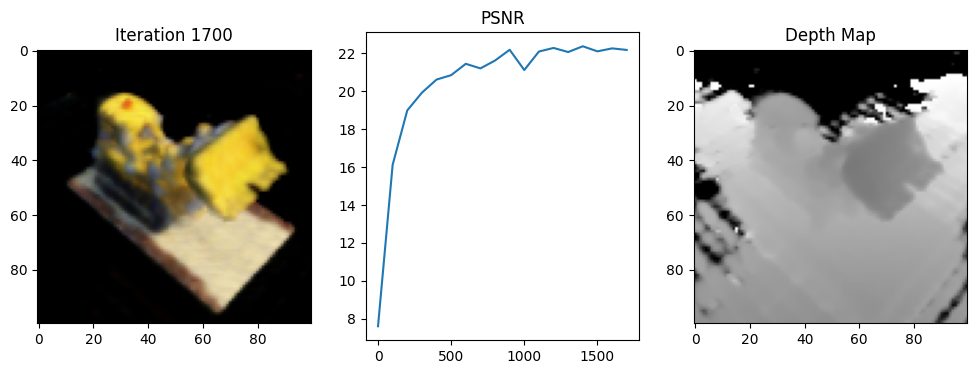

 18%|█▊        | 1799/10000 [02:40<10:09, 13.45it/s]

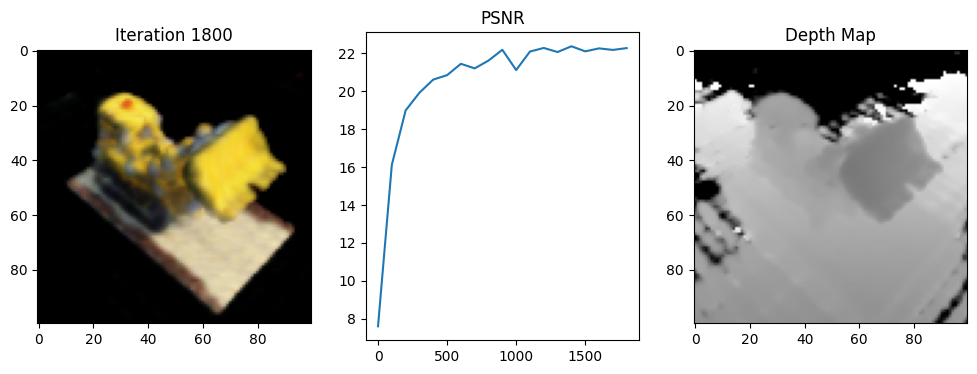

 19%|█▉        | 1899/10000 [02:49<10:04, 13.40it/s]

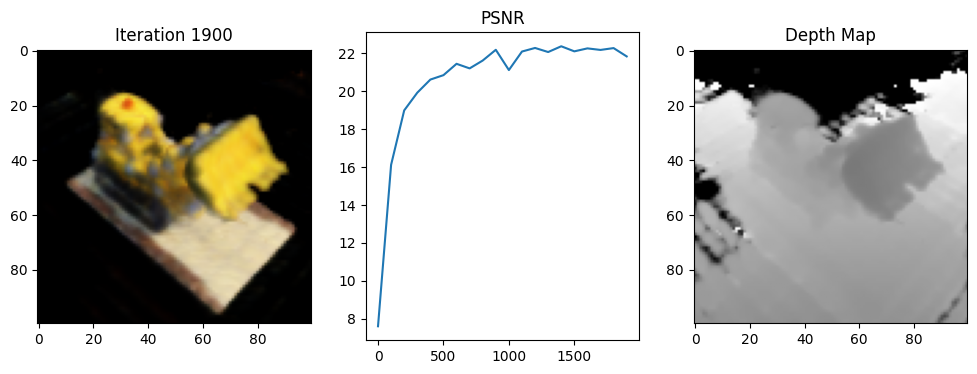

 20%|█▉        | 1999/10000 [02:57<10:14, 13.03it/s]

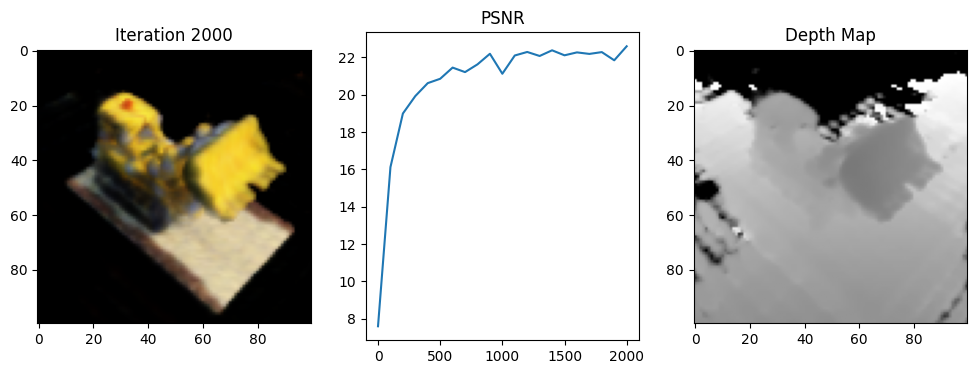

 21%|██        | 2099/10000 [03:06<09:48, 13.42it/s]

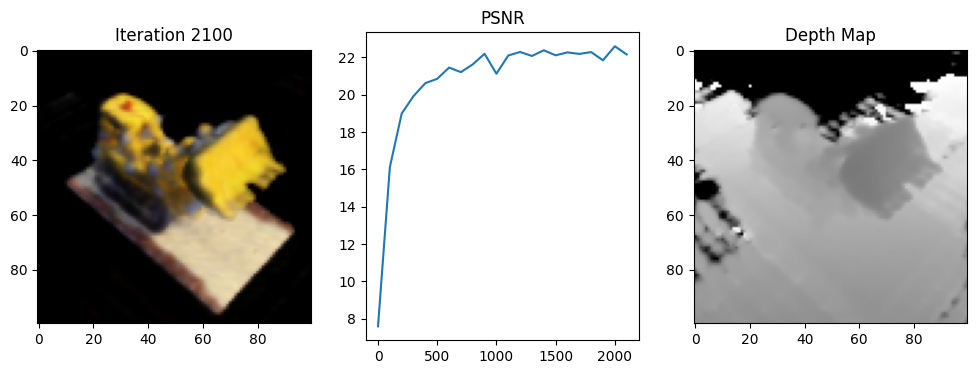

 22%|██▏       | 2199/10000 [03:15<09:47, 13.28it/s]

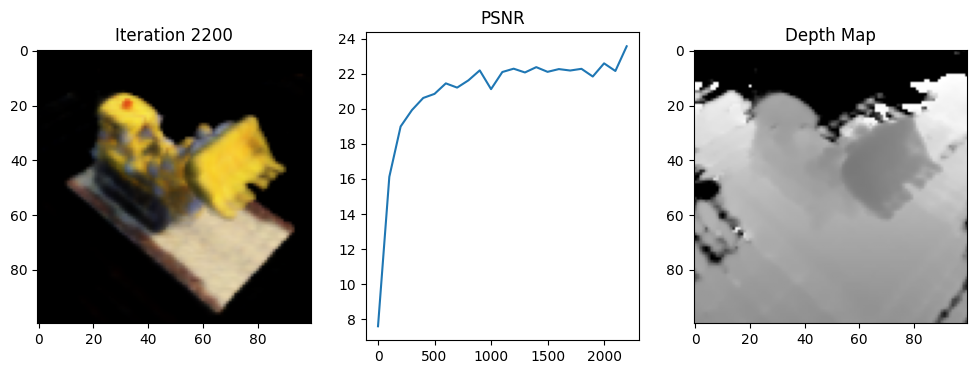

 23%|██▎       | 2299/10000 [03:24<10:00, 12.82it/s]

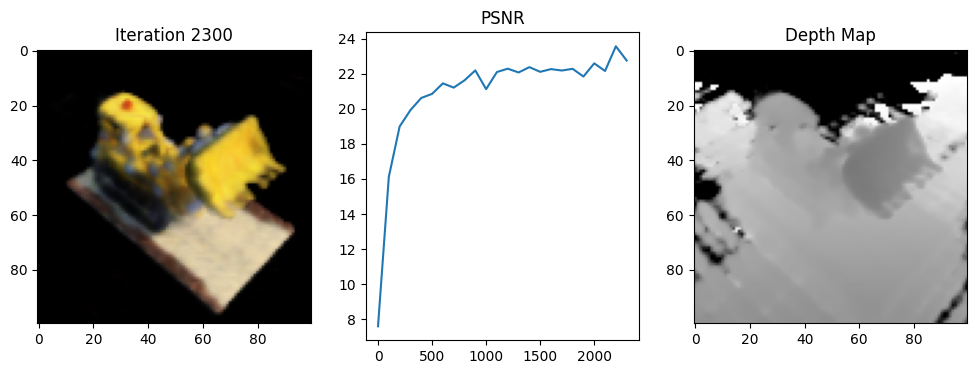

 24%|██▍       | 2399/10000 [03:34<09:27, 13.38it/s]

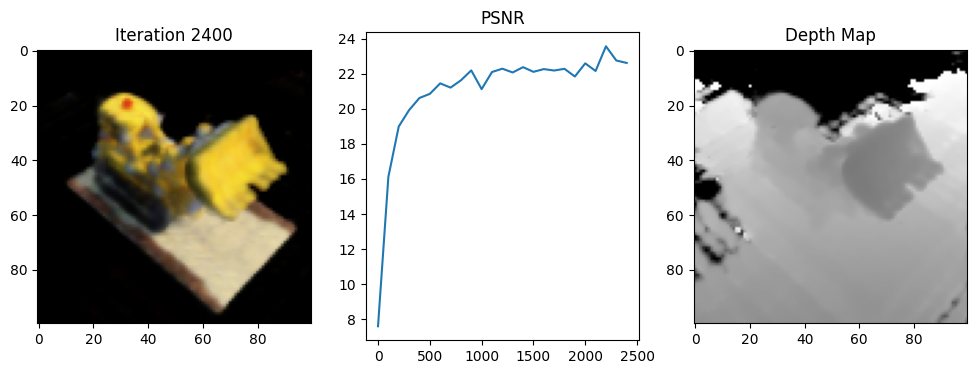

 25%|██▍       | 2499/10000 [03:42<09:21, 13.36it/s]

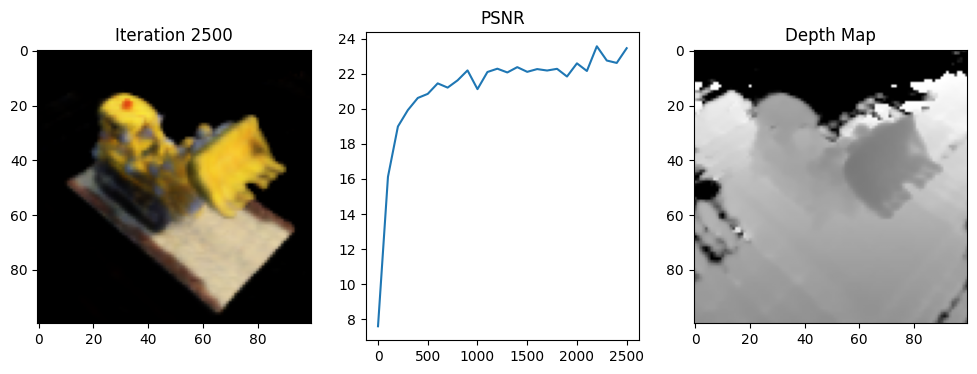

 26%|██▌       | 2599/10000 [03:51<09:12, 13.40it/s]

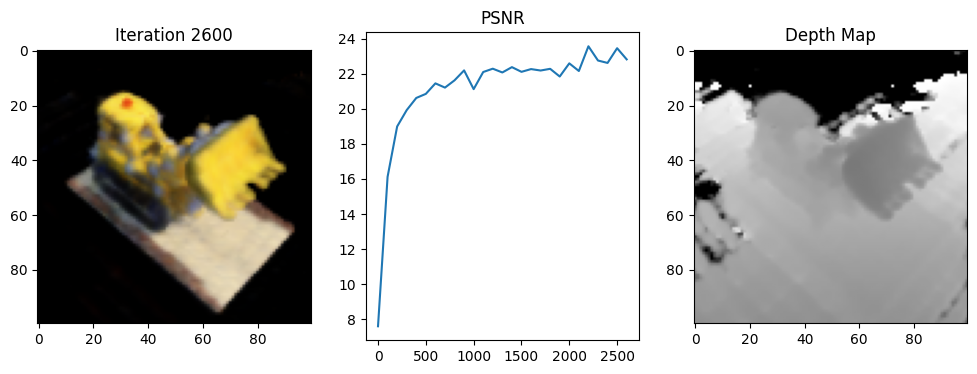

 27%|██▋       | 2699/10000 [04:00<09:27, 12.87it/s]

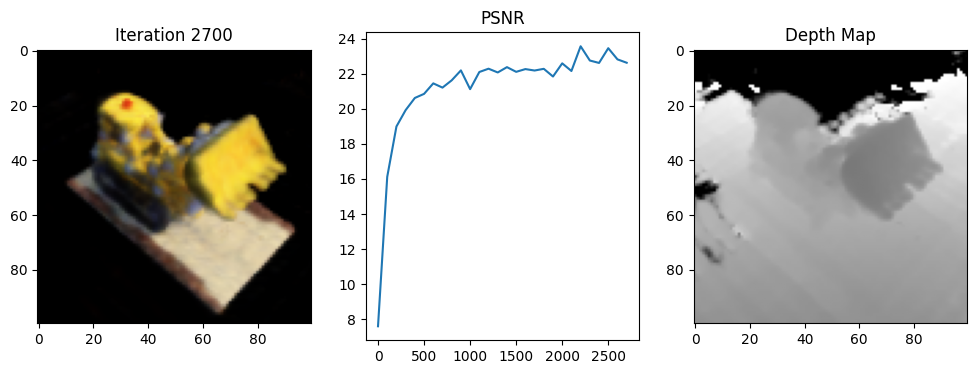

 28%|██▊       | 2799/10000 [04:09<08:58, 13.37it/s]

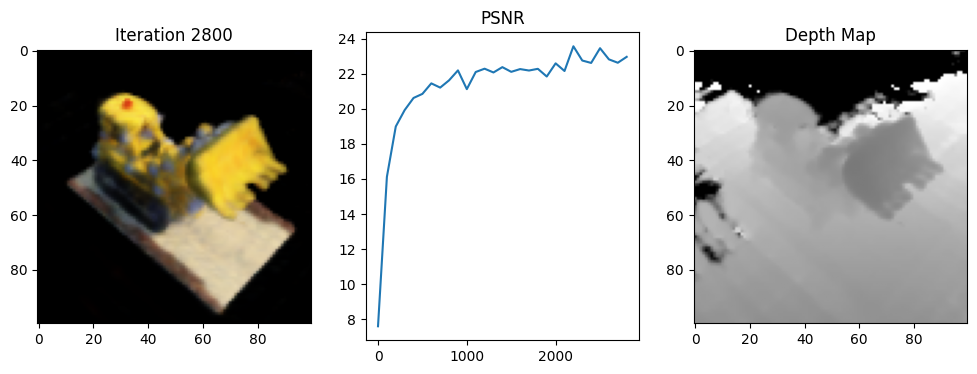

 29%|██▉       | 2899/10000 [04:18<08:49, 13.41it/s]

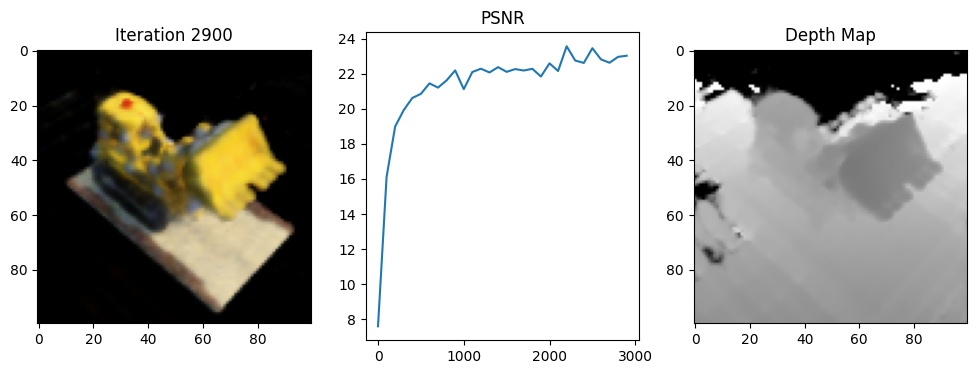

 30%|██▉       | 2999/10000 [04:27<08:58, 12.99it/s]

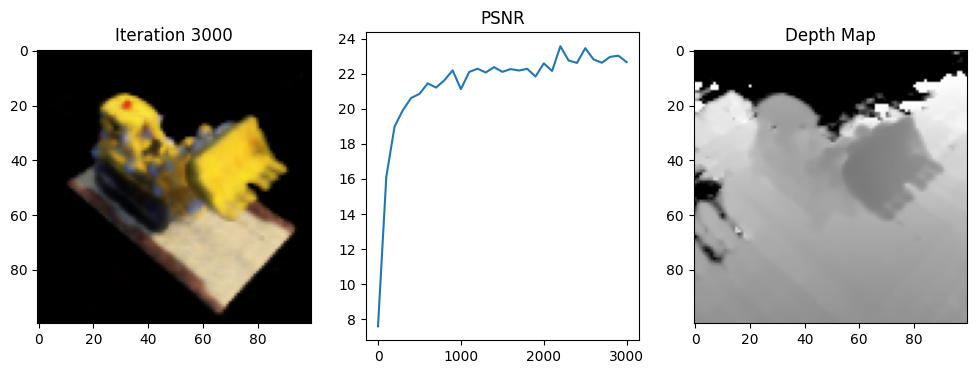

 31%|███       | 3099/10000 [04:36<08:37, 13.33it/s]

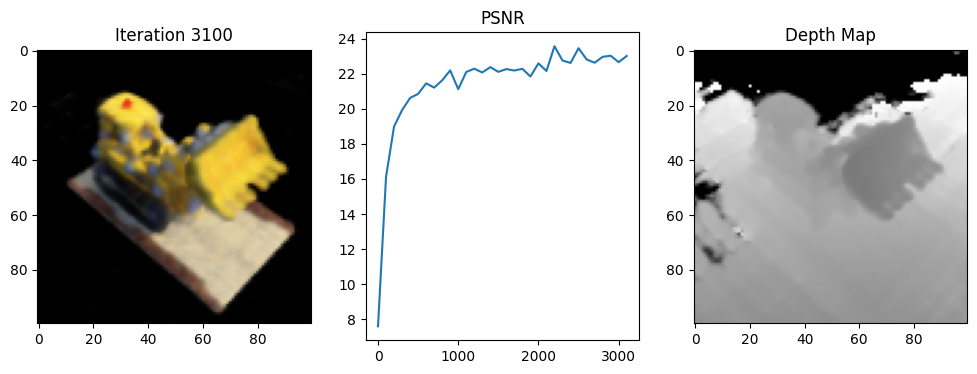

 32%|███▏      | 3199/10000 [04:45<08:28, 13.38it/s]

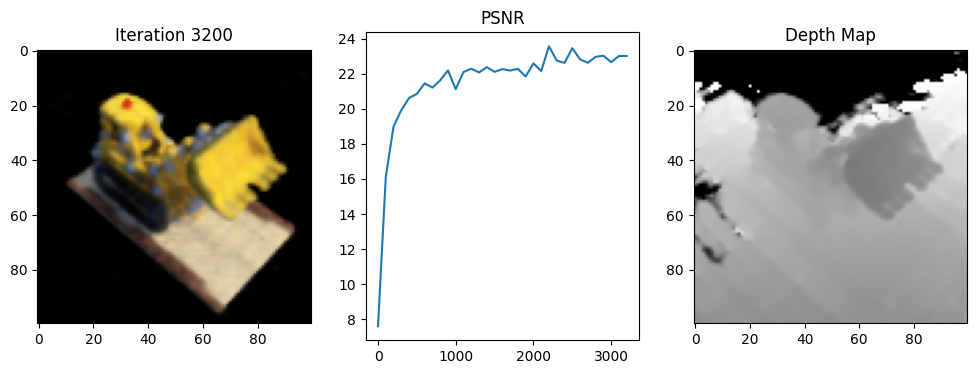

 33%|███▎      | 3299/10000 [04:54<08:41, 12.84it/s]

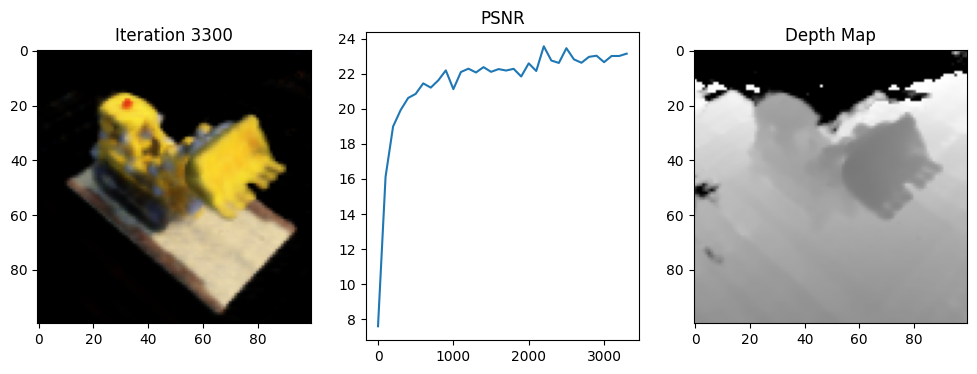

 34%|███▍      | 3399/10000 [05:03<08:12, 13.40it/s]

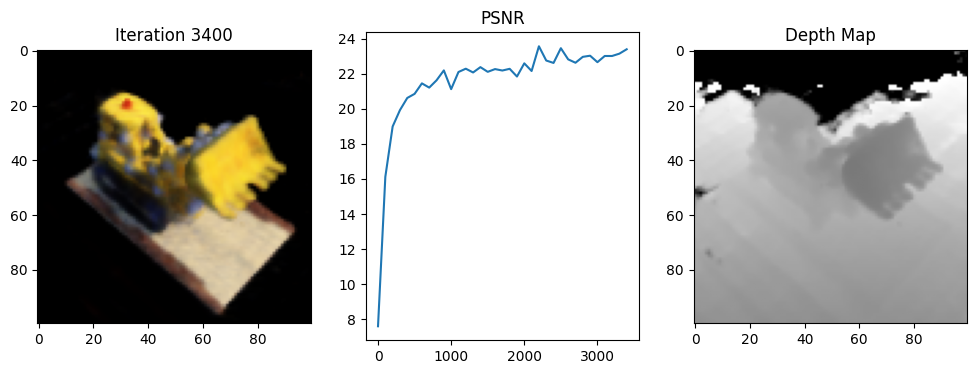

 35%|███▍      | 3499/10000 [05:12<08:06, 13.38it/s]

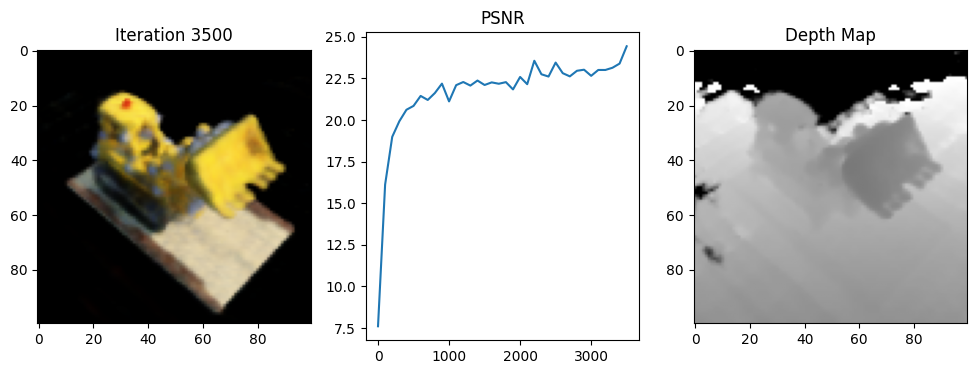

 36%|███▌      | 3599/10000 [05:21<08:06, 13.15it/s]

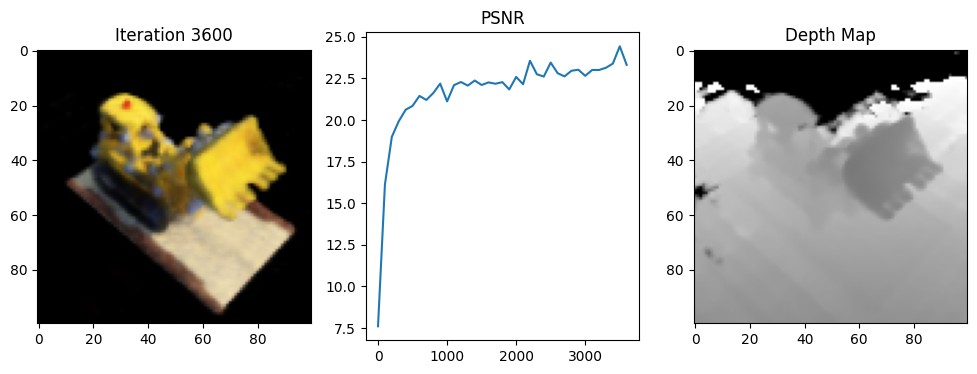

 37%|███▋      | 3699/10000 [05:30<07:48, 13.45it/s]

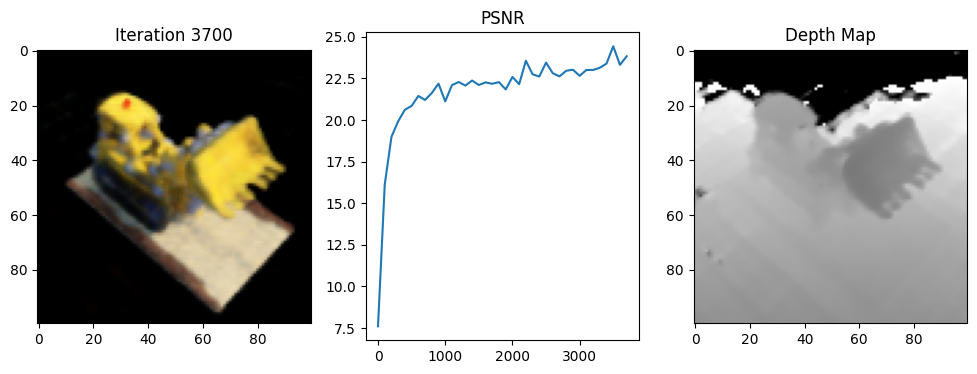

 38%|███▊      | 3799/10000 [05:39<07:40, 13.45it/s]

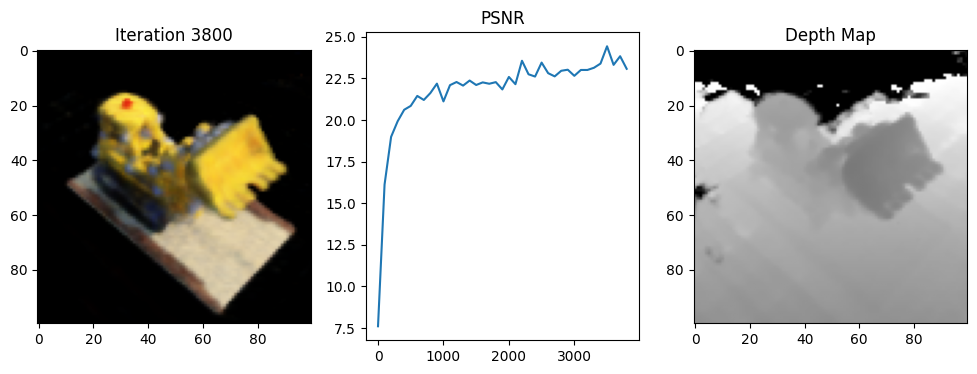

 39%|███▉      | 3899/10000 [05:48<07:34, 13.42it/s]

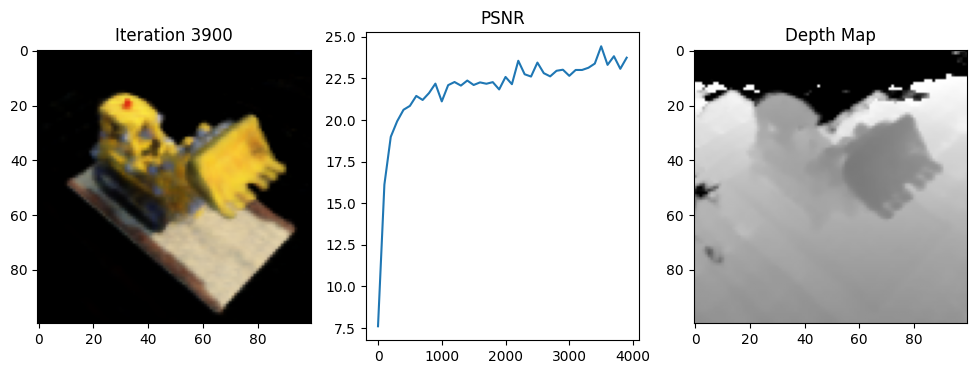

 40%|███▉      | 3999/10000 [05:57<07:50, 12.75it/s]

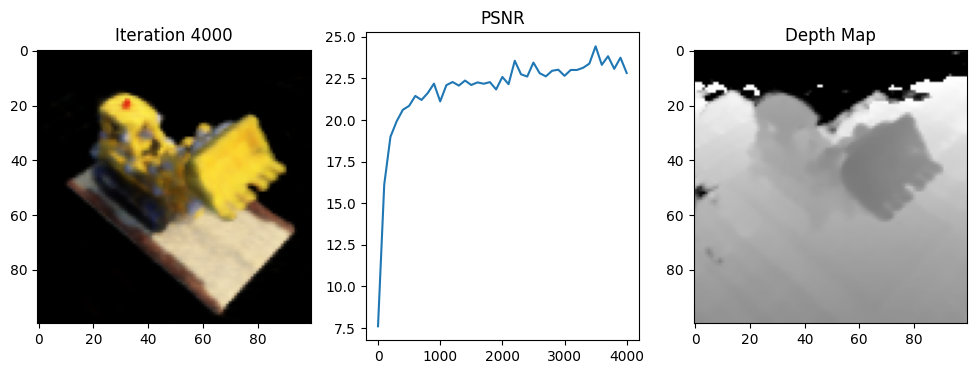

 41%|████      | 4099/10000 [06:06<07:22, 13.34it/s]

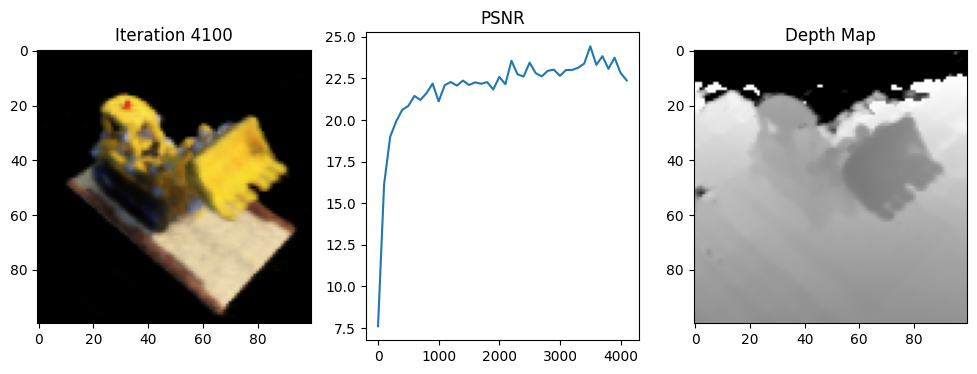

 42%|████▏     | 4199/10000 [06:15<07:12, 13.40it/s]

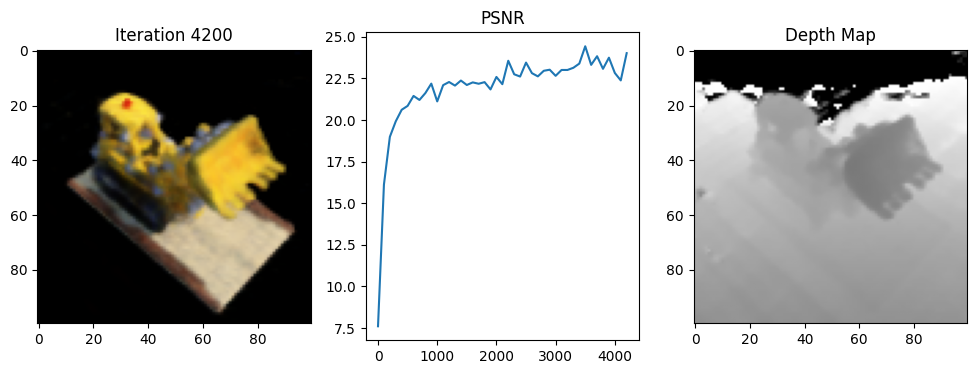

 43%|████▎     | 4299/10000 [06:24<07:45, 12.24it/s]

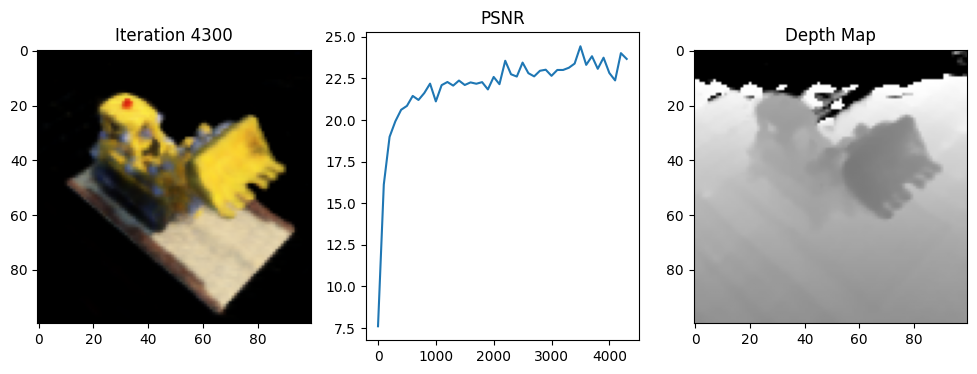

 44%|████▍     | 4399/10000 [06:33<06:58, 13.38it/s]

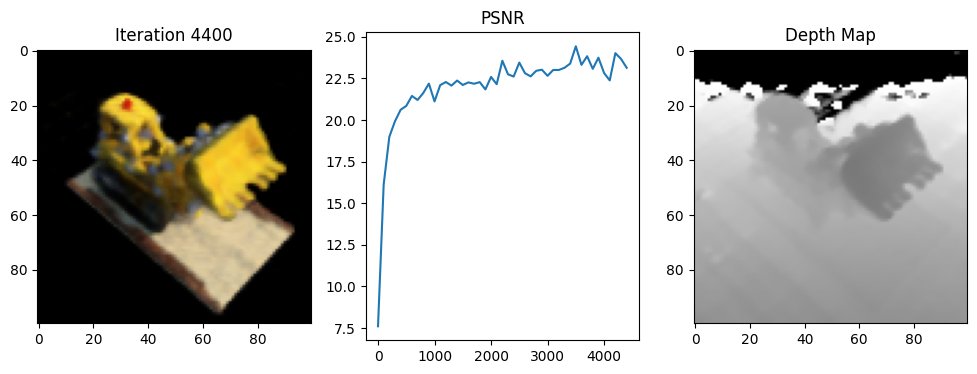

 45%|████▍     | 4499/10000 [06:42<06:52, 13.34it/s]

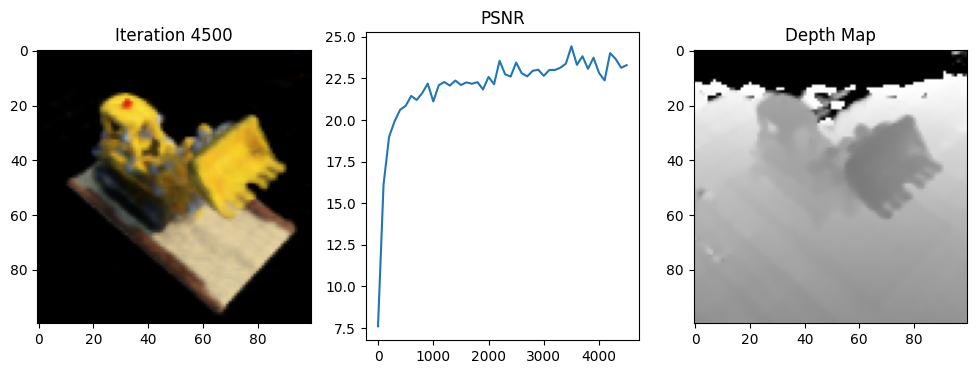

 46%|████▌     | 4599/10000 [06:51<07:10, 12.55it/s]

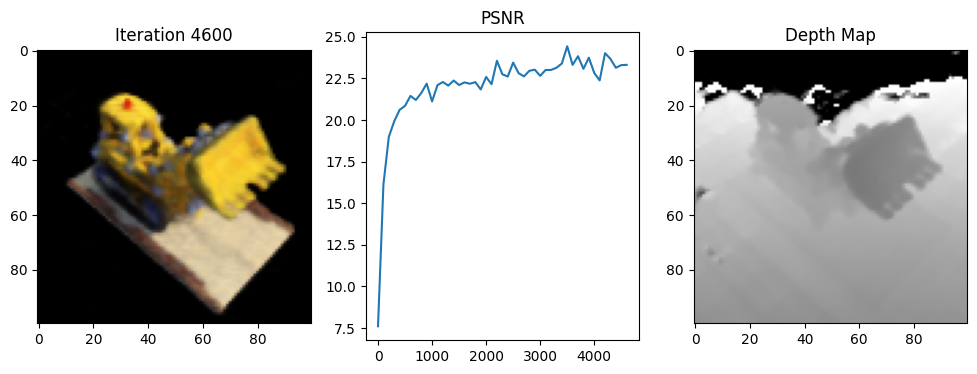

 47%|████▋     | 4699/10000 [07:01<06:34, 13.43it/s]

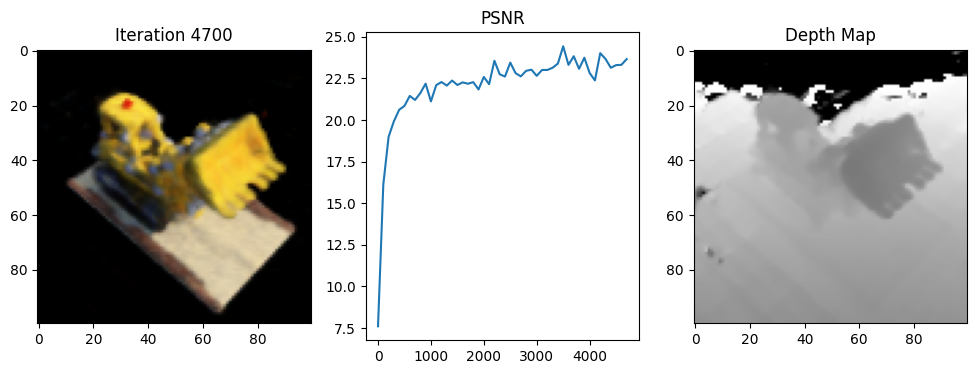

 48%|████▊     | 4799/10000 [07:10<06:28, 13.38it/s]

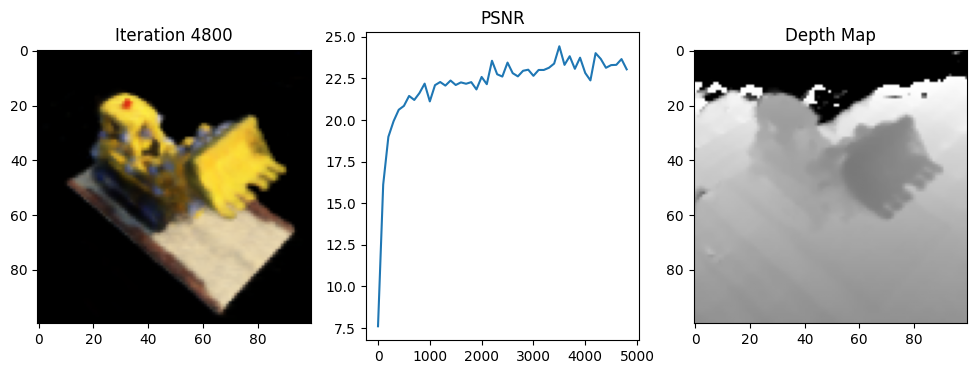

 49%|████▉     | 4899/10000 [07:19<06:46, 12.54it/s]

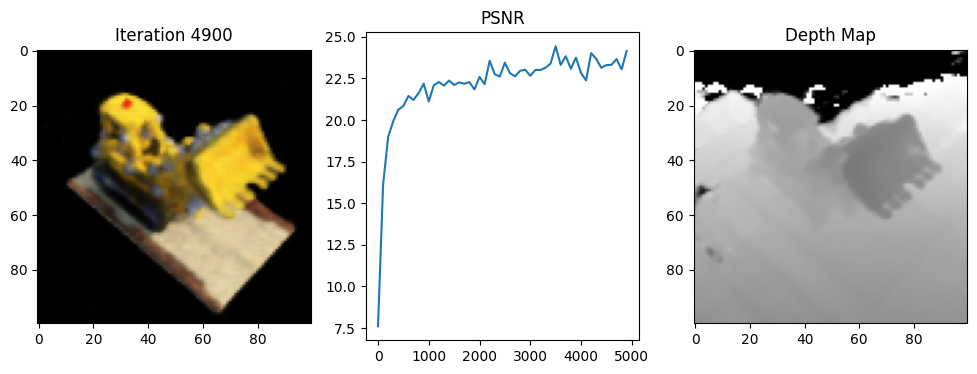

 50%|████▉     | 4999/10000 [07:28<06:17, 13.26it/s]

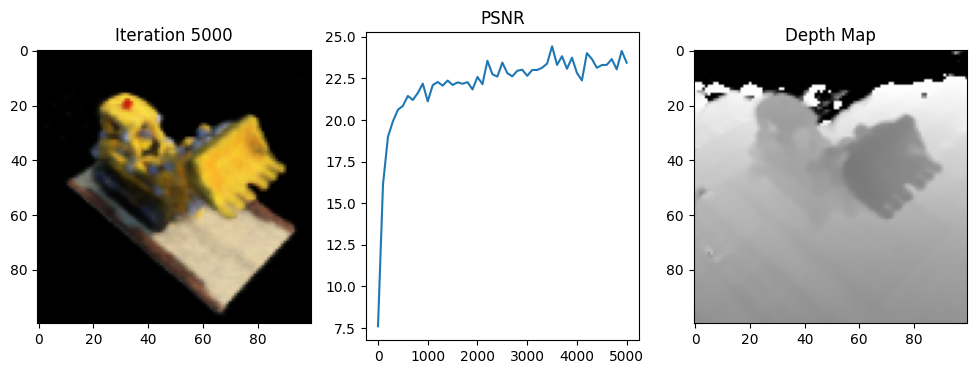

 51%|█████     | 5099/10000 [07:37<06:08, 13.30it/s]

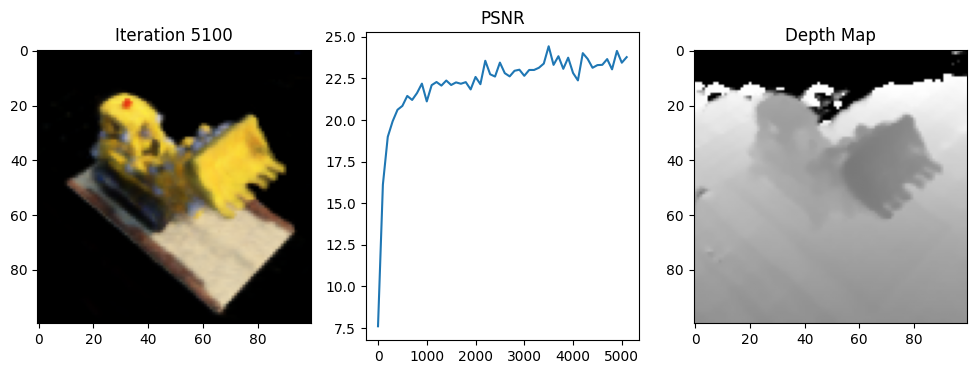

 52%|█████▏    | 5199/10000 [07:46<06:07, 13.05it/s]

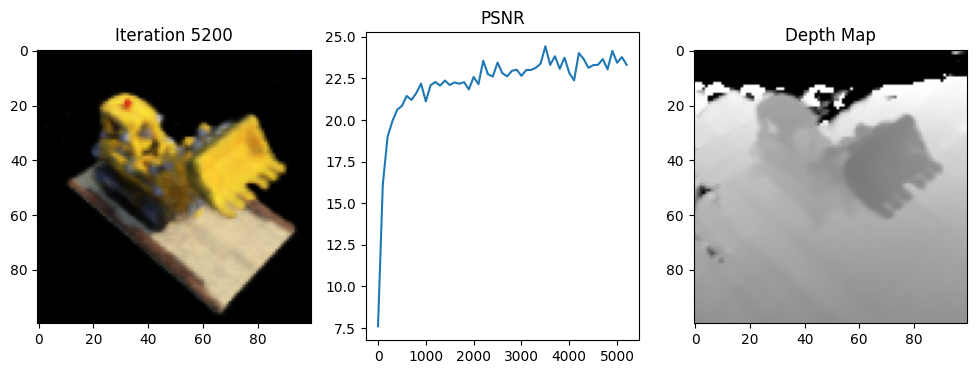

 53%|█████▎    | 5299/10000 [07:55<05:54, 13.25it/s]

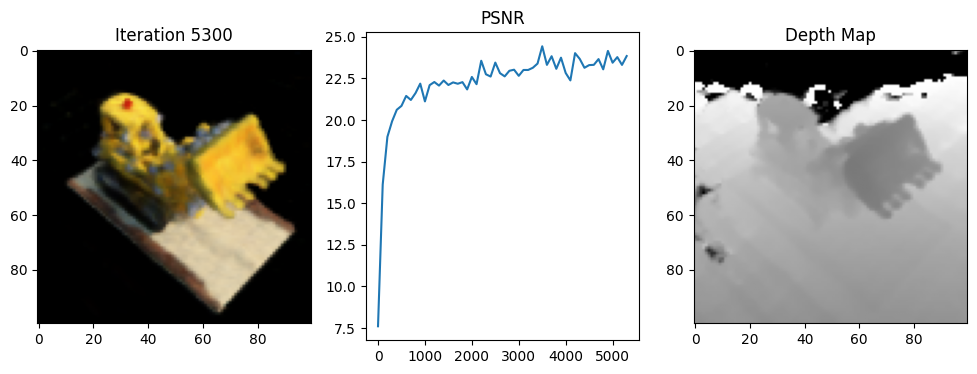

 54%|█████▍    | 5399/10000 [08:04<06:00, 12.76it/s]

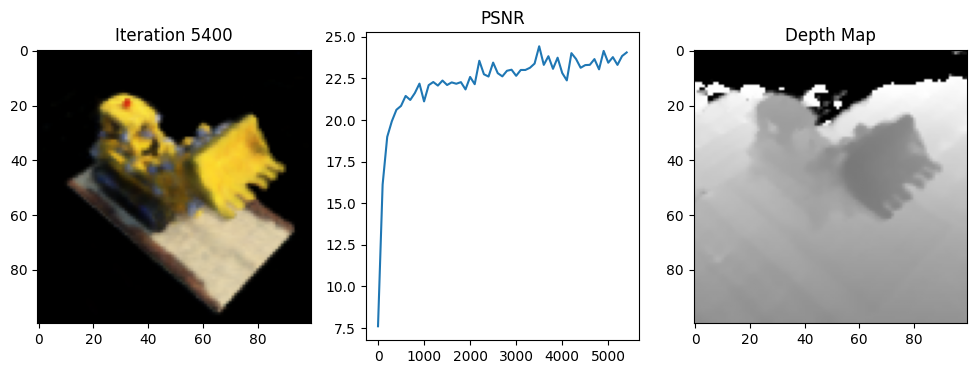

 55%|█████▍    | 5499/10000 [08:13<05:53, 12.73it/s]

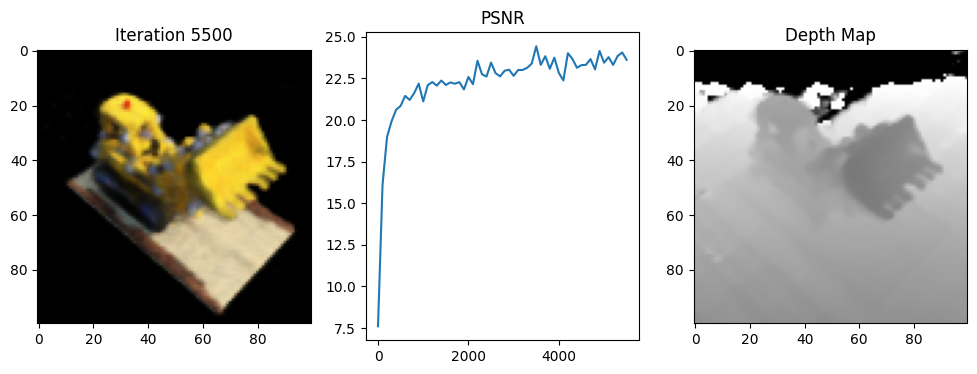

 56%|█████▌    | 5599/10000 [08:22<05:35, 13.11it/s]

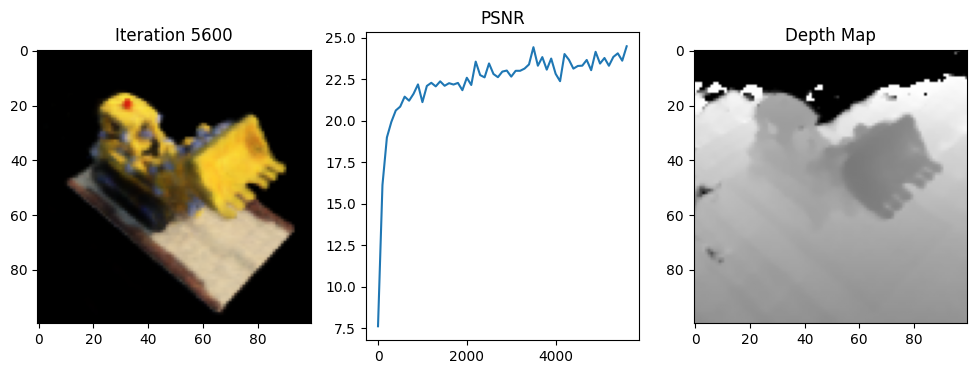

 57%|█████▋    | 5699/10000 [08:32<05:29, 13.04it/s]

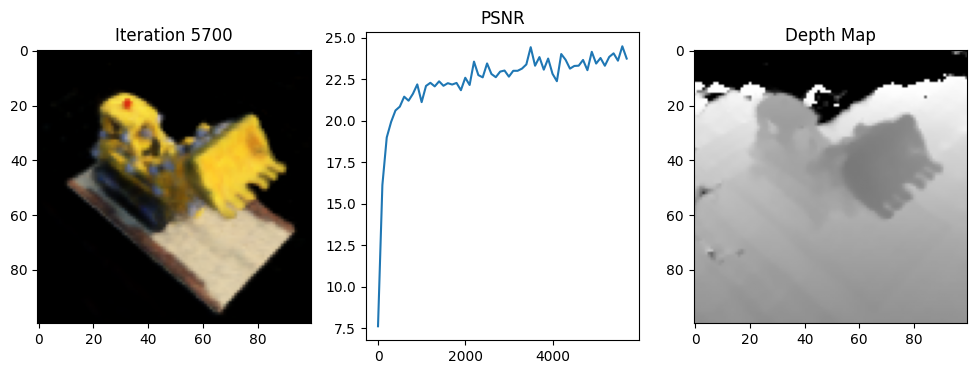

 58%|█████▊    | 5799/10000 [08:41<05:28, 12.80it/s]

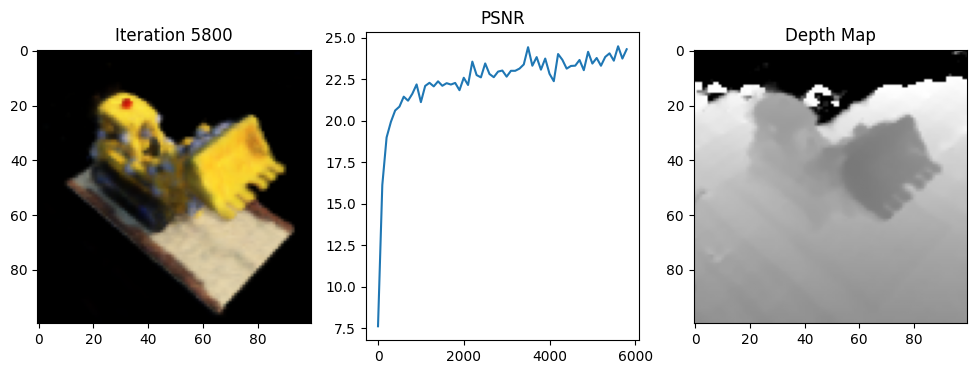

 59%|█████▉    | 5899/10000 [08:50<05:12, 13.12it/s]

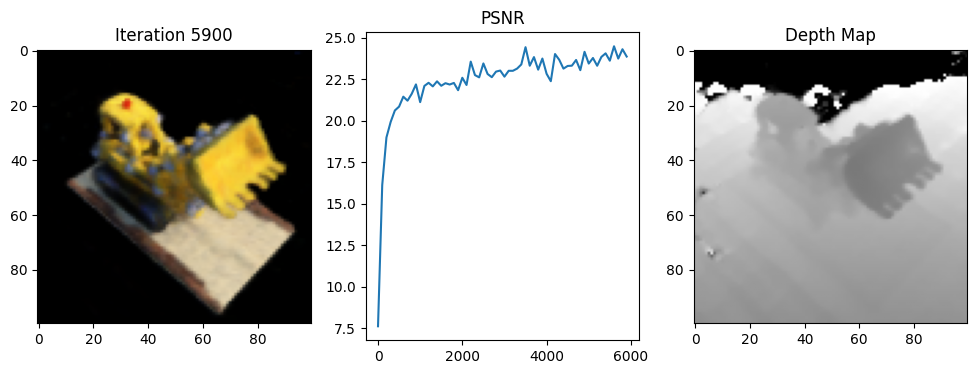

 60%|█████▉    | 5999/10000 [08:59<05:04, 13.14it/s]

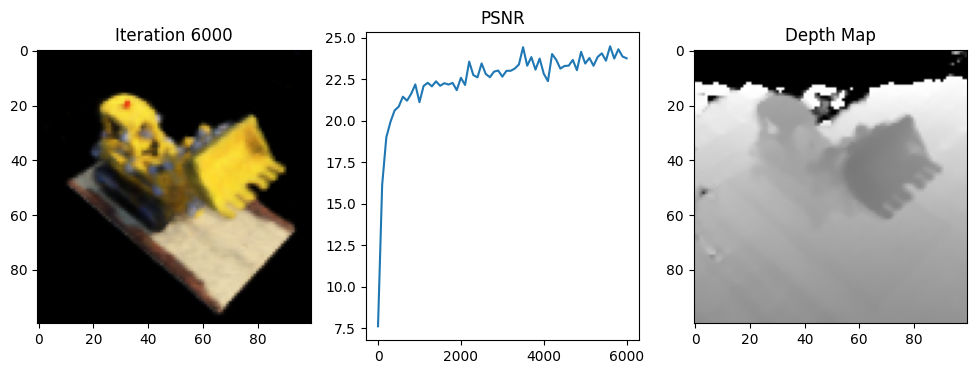

 61%|██████    | 6099/10000 [09:08<05:14, 12.41it/s]

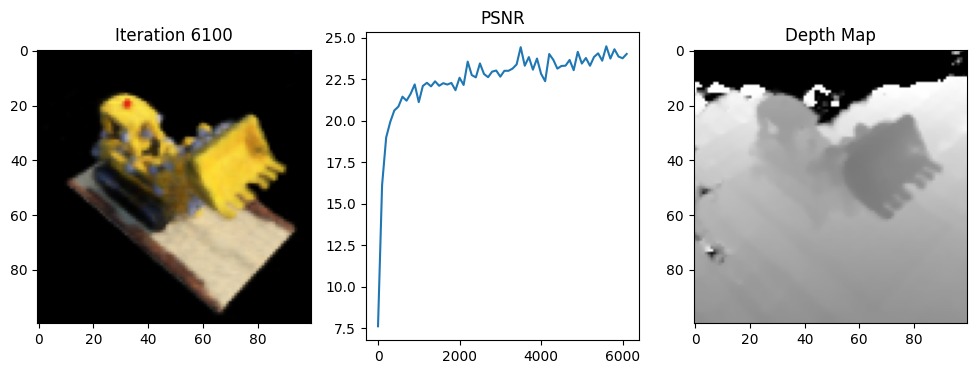

 62%|██████▏   | 6199/10000 [09:17<04:51, 13.05it/s]

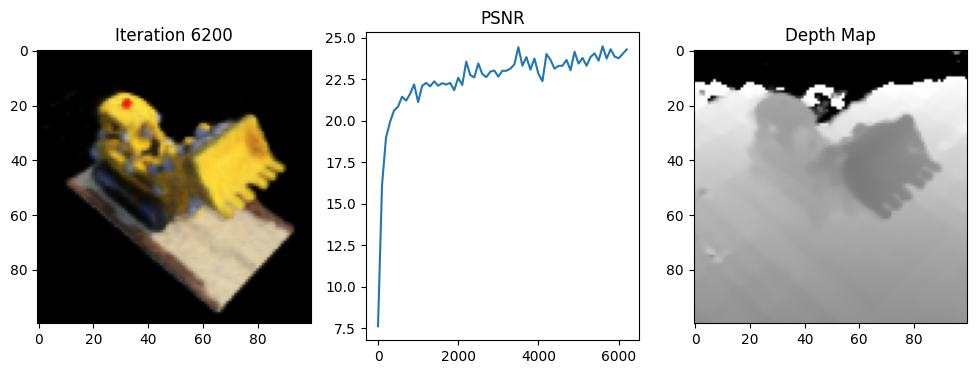

 63%|██████▎   | 6299/10000 [09:27<04:42, 13.09it/s]

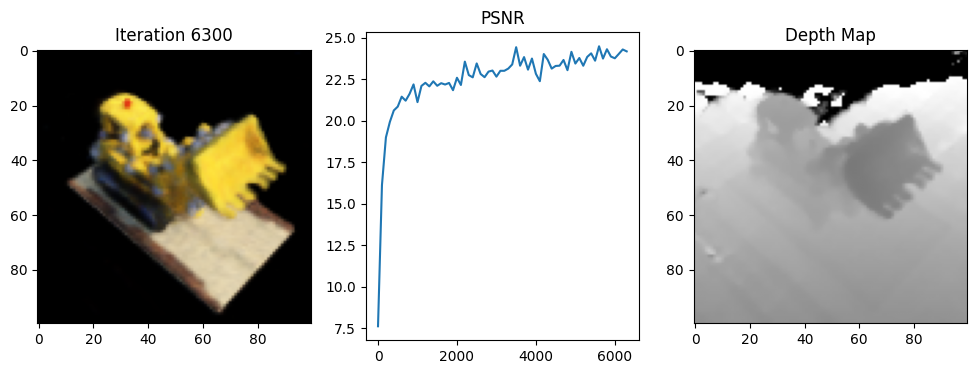

 64%|██████▍   | 6399/10000 [09:36<04:40, 12.84it/s]

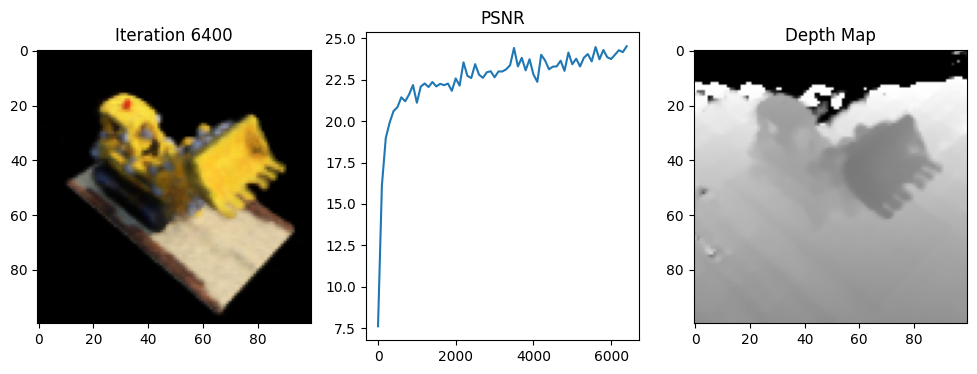

 65%|██████▍   | 6499/10000 [09:45<04:26, 13.13it/s]

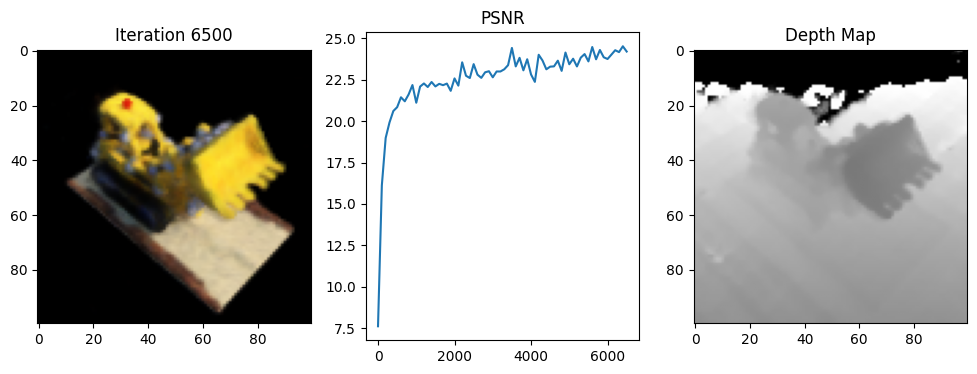

 66%|██████▌   | 6599/10000 [09:54<04:21, 13.01it/s]

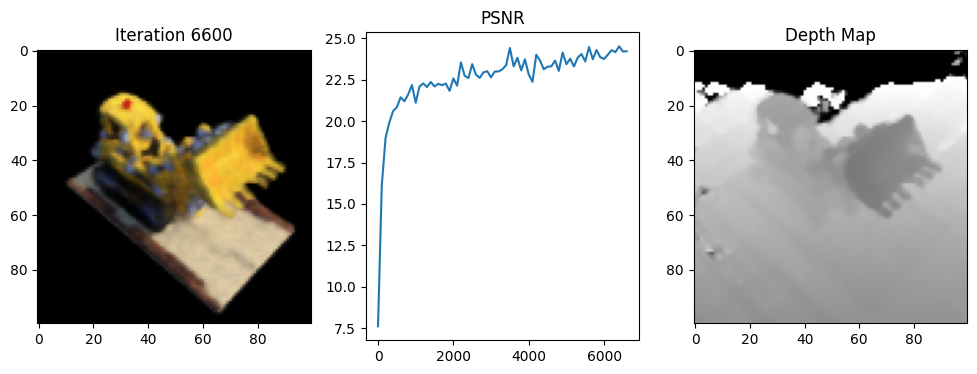

 67%|██████▋   | 6699/10000 [10:03<04:27, 12.35it/s]

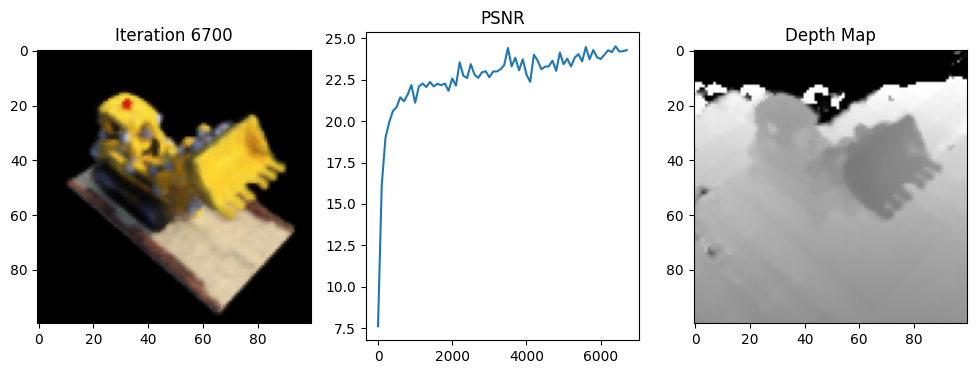

 68%|██████▊   | 6799/10000 [10:12<04:02, 13.18it/s]

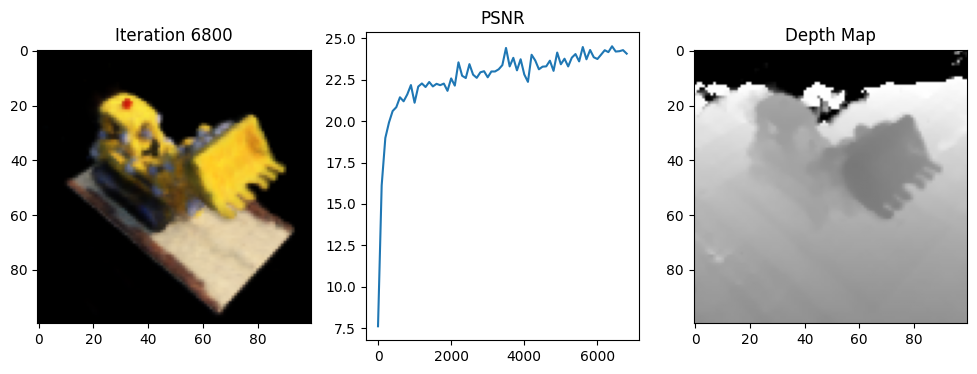

 69%|██████▉   | 6899/10000 [10:22<03:58, 12.99it/s]

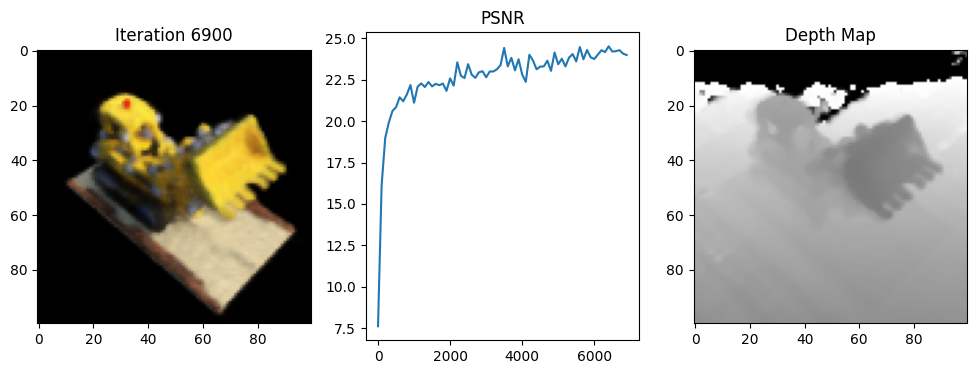

 70%|██████▉   | 6999/10000 [10:31<03:57, 12.66it/s]

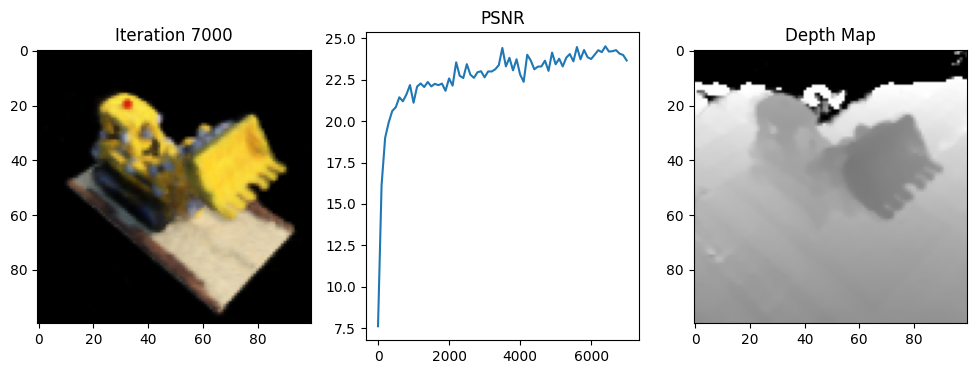

 71%|███████   | 7099/10000 [10:40<03:40, 13.16it/s]

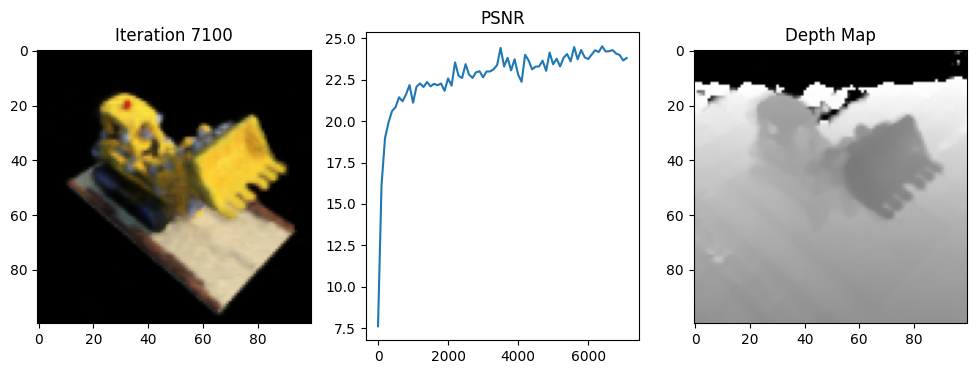

 72%|███████▏  | 7199/10000 [10:49<03:33, 13.13it/s]

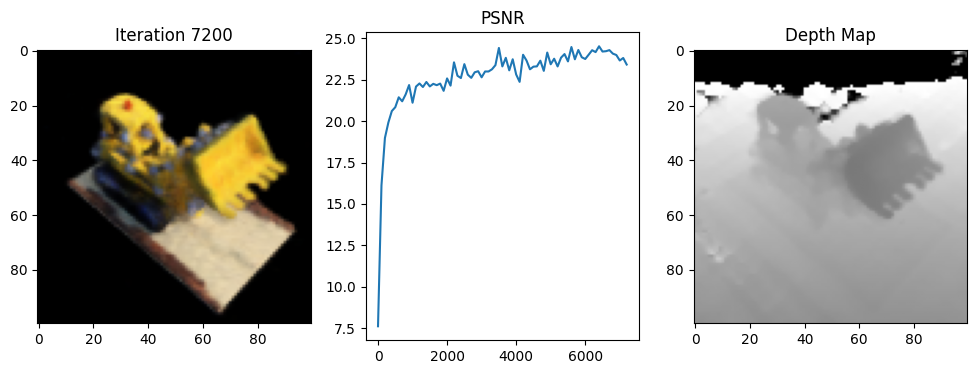

 73%|███████▎  | 7299/10000 [10:58<03:26, 13.06it/s]

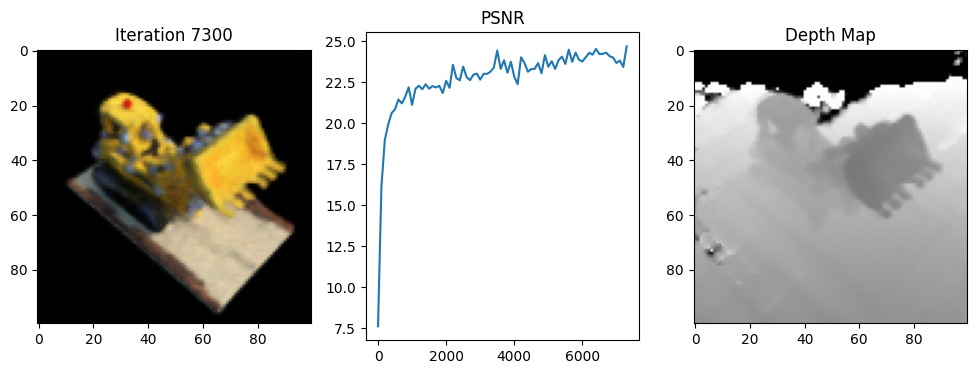

 74%|███████▍  | 7399/10000 [11:07<03:17, 13.15it/s]

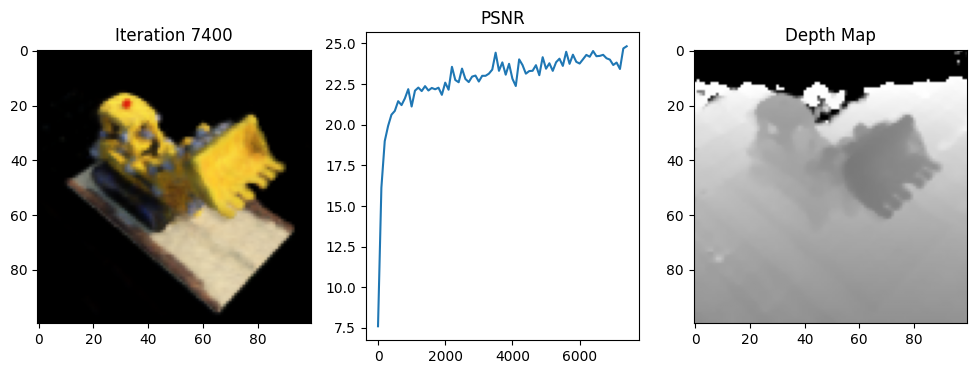

 75%|███████▍  | 7499/10000 [11:17<03:10, 13.10it/s]

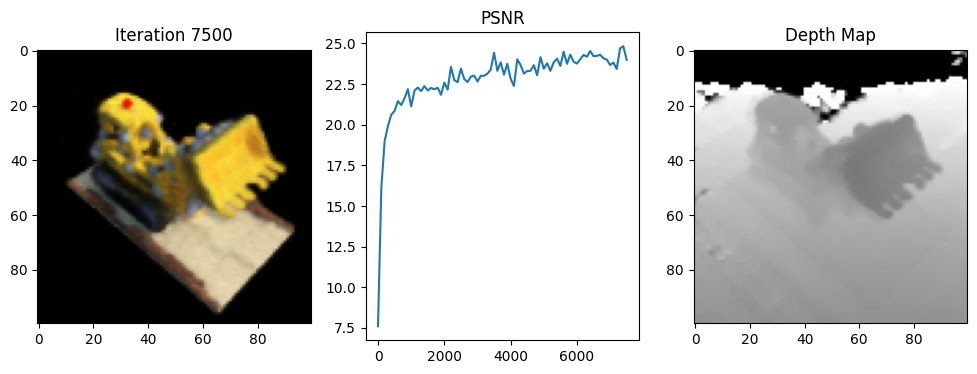

 76%|███████▌  | 7599/10000 [11:26<03:15, 12.27it/s]

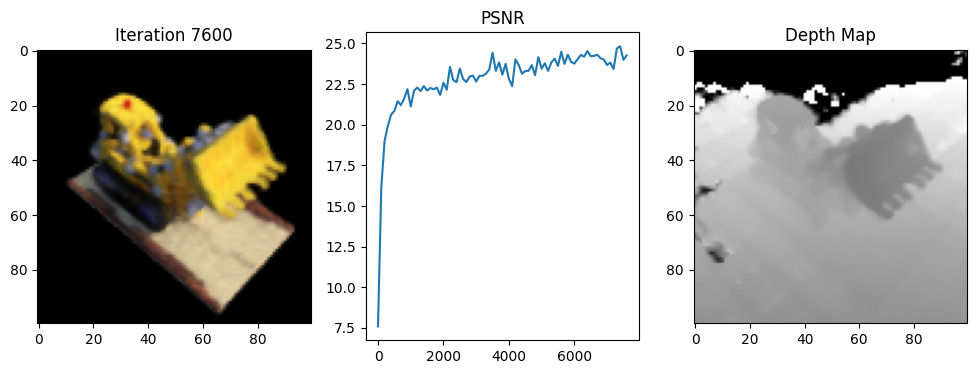

 77%|███████▋  | 7699/10000 [11:35<02:55, 13.10it/s]

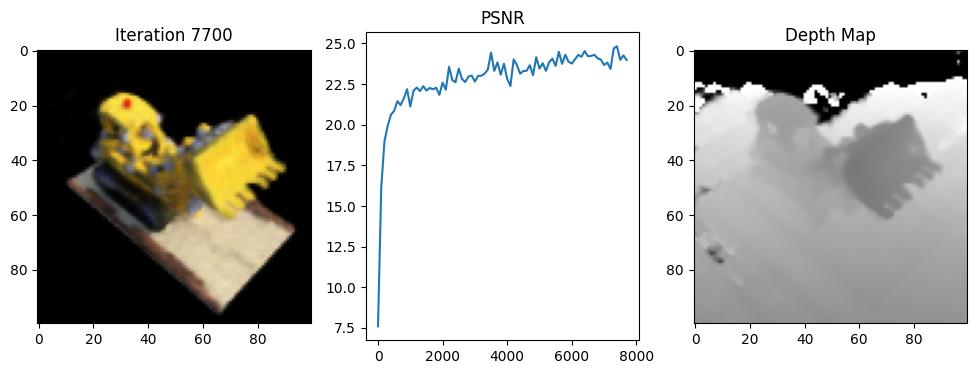

 78%|███████▊  | 7799/10000 [11:44<02:47, 13.12it/s]

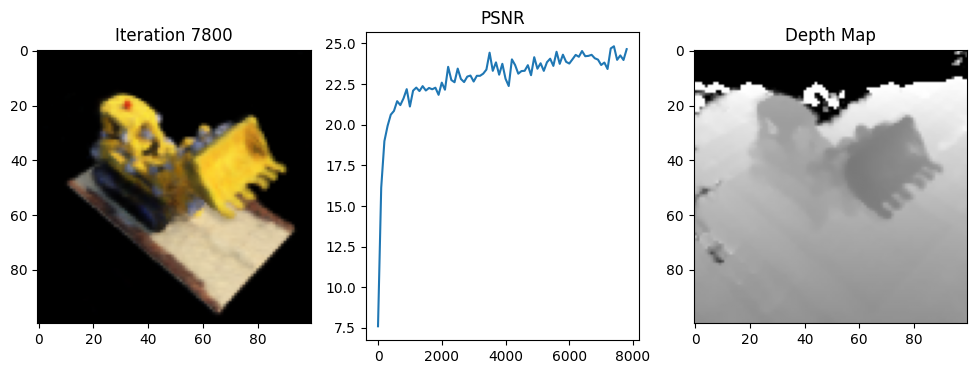

 79%|███████▉  | 7899/10000 [11:53<02:42, 12.96it/s]

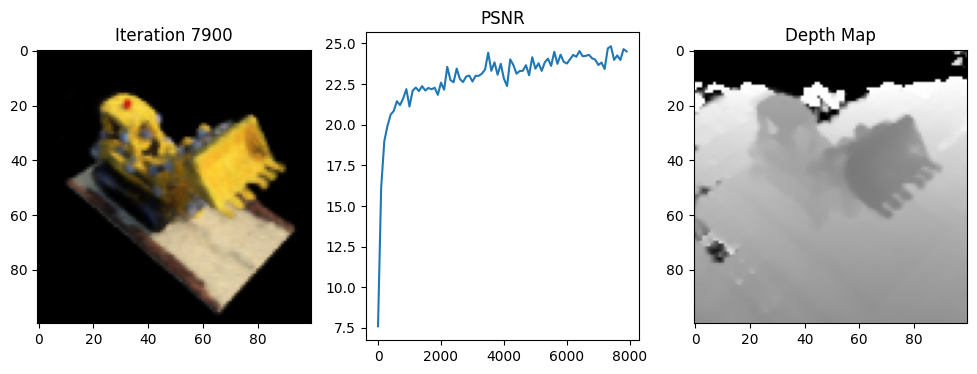

 80%|███████▉  | 7999/10000 [12:03<02:32, 13.15it/s]

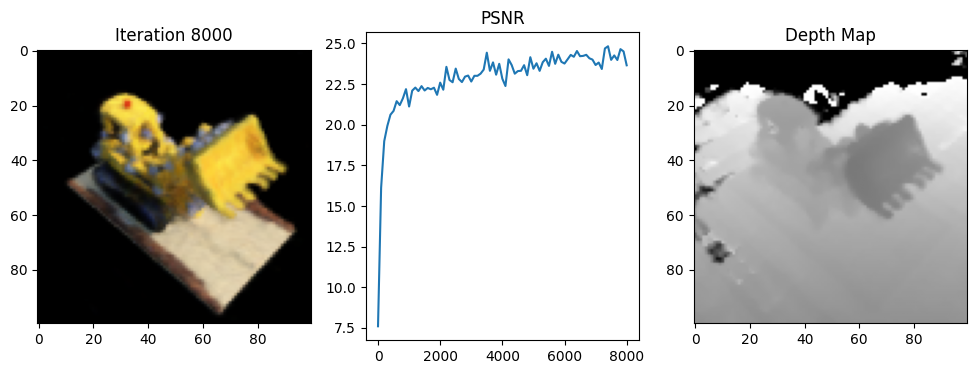

 81%|████████  | 8099/10000 [12:12<02:27, 12.92it/s]

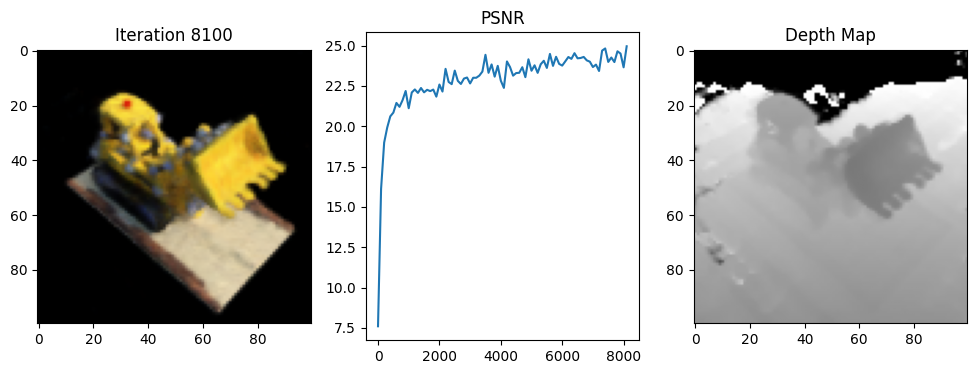

 82%|████████▏ | 8199/10000 [12:21<02:24, 12.47it/s]

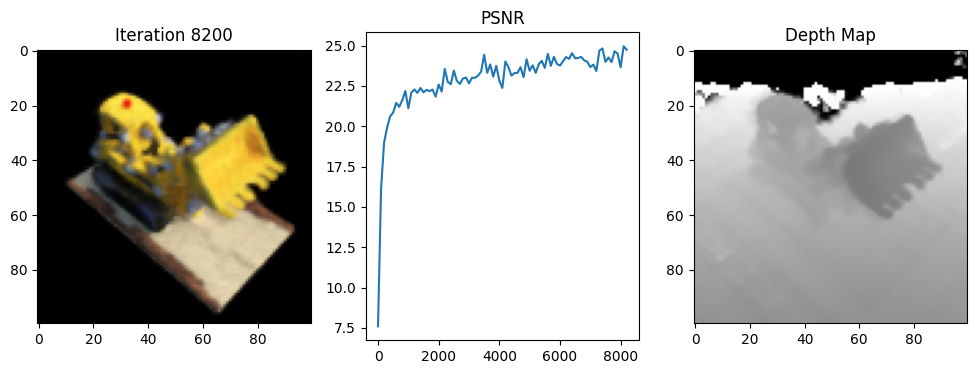

 83%|████████▎ | 8299/10000 [12:30<02:14, 12.66it/s]

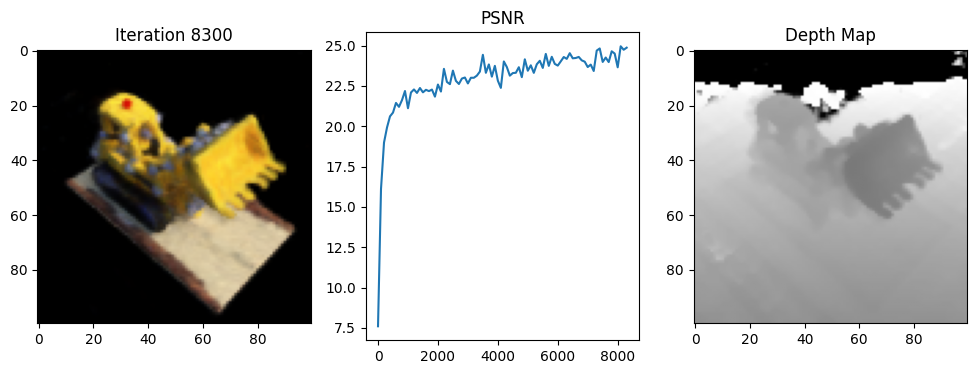

 84%|████████▍ | 8399/10000 [12:40<02:01, 13.15it/s]

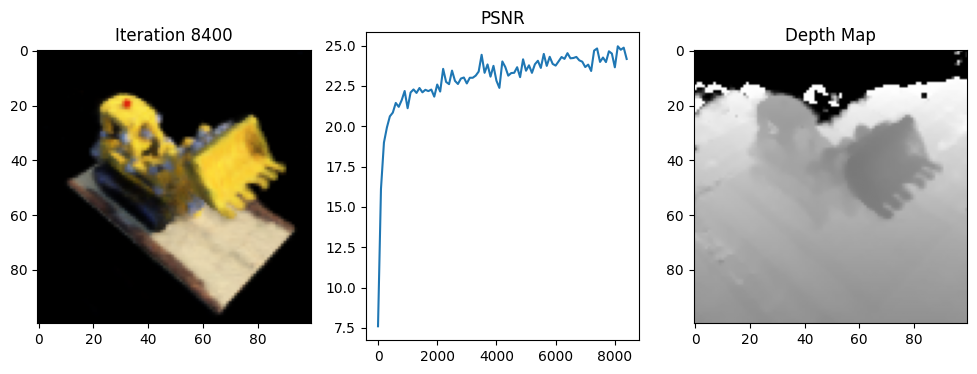

 85%|████████▍ | 8499/10000 [12:49<01:56, 12.84it/s]

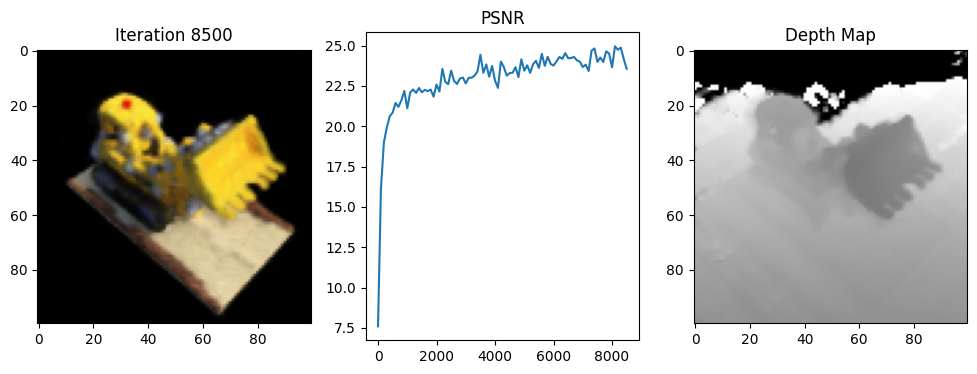

 86%|████████▌ | 8599/10000 [12:58<01:46, 13.09it/s]

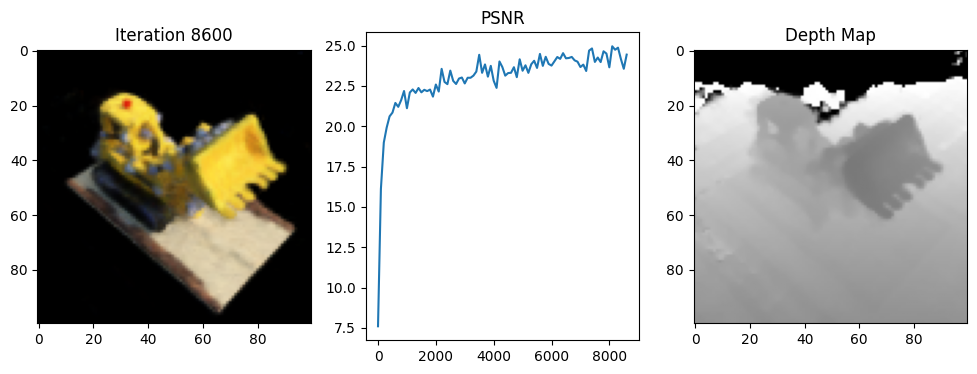

 87%|████████▋ | 8699/10000 [13:07<01:39, 13.08it/s]

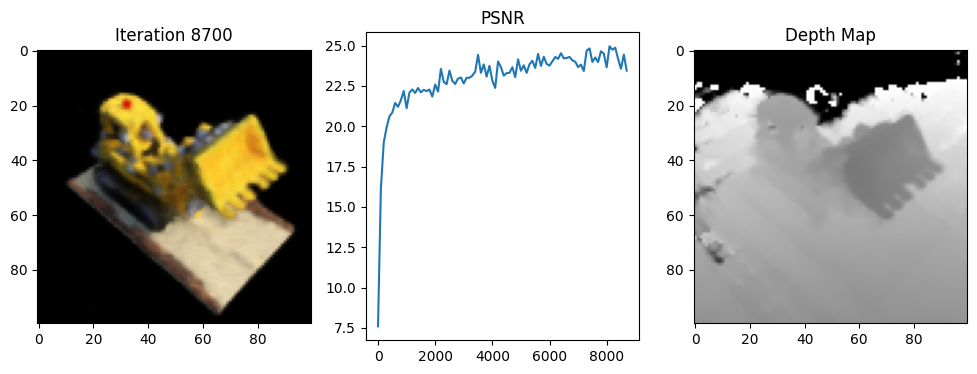

 88%|████████▊ | 8799/10000 [13:17<01:32, 12.94it/s]

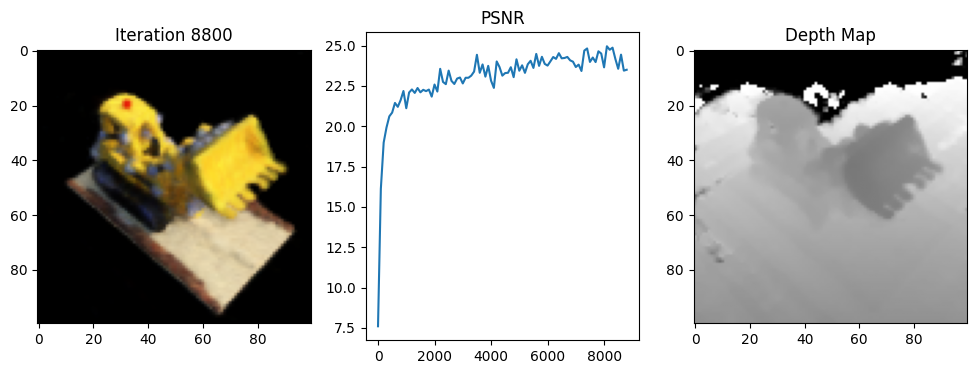

 89%|████████▉ | 8899/10000 [13:26<01:23, 13.18it/s]

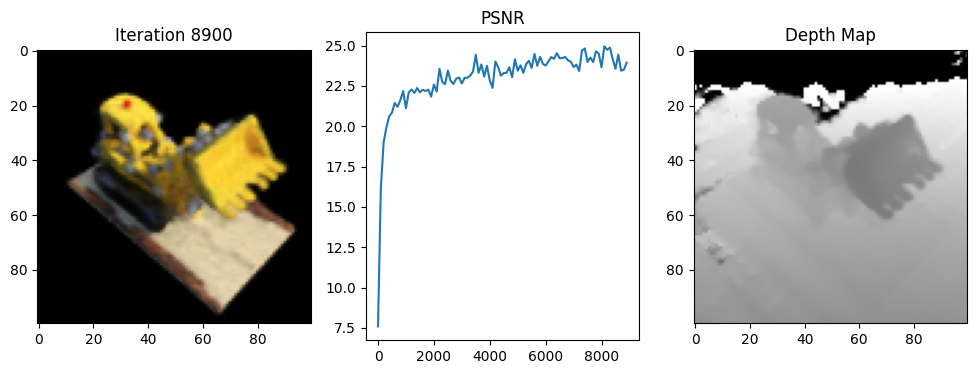

 90%|████████▉ | 8999/10000 [13:35<01:16, 13.15it/s]

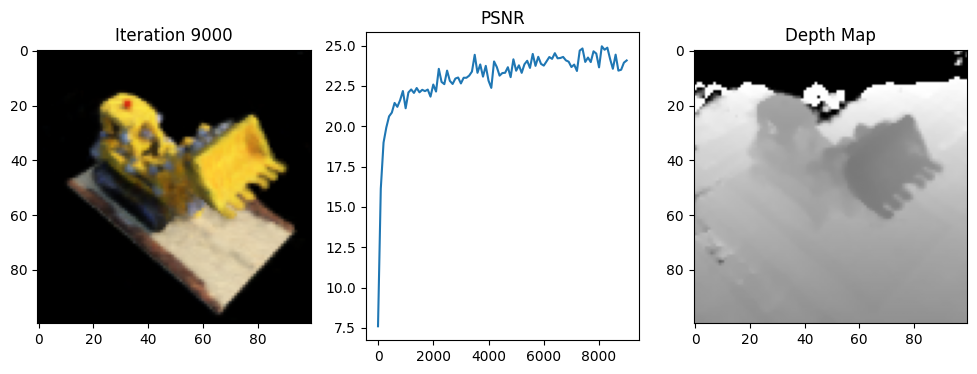

 91%|█████████ | 9099/10000 [13:44<01:11, 12.53it/s]

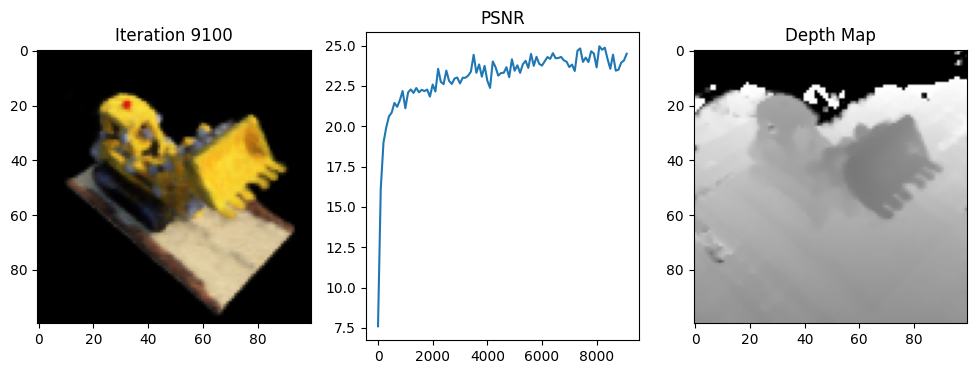

 92%|█████████▏| 9199/10000 [13:54<01:01, 13.12it/s]

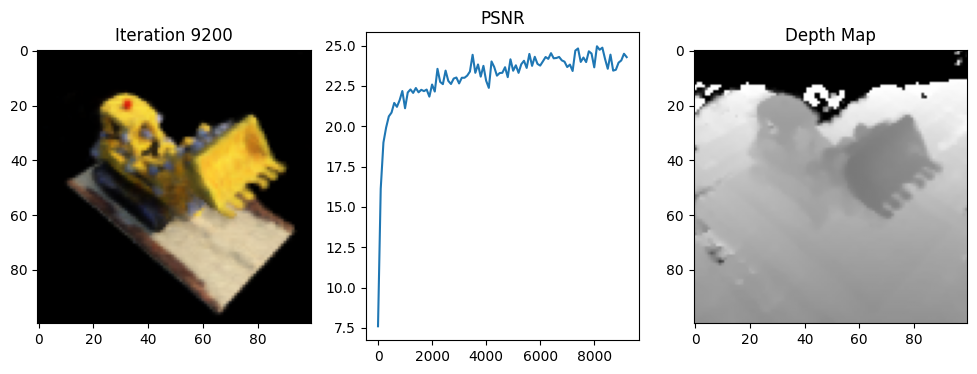

 93%|█████████▎| 9299/10000 [14:03<00:53, 13.09it/s]

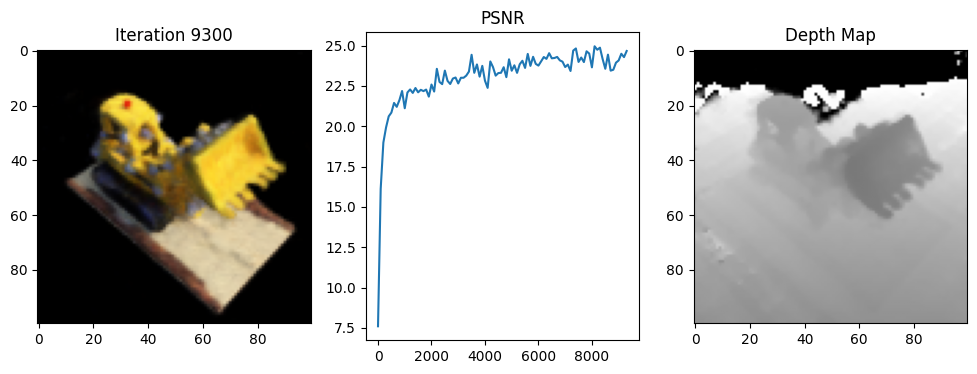

 94%|█████████▍| 9399/10000 [14:12<00:47, 12.64it/s]

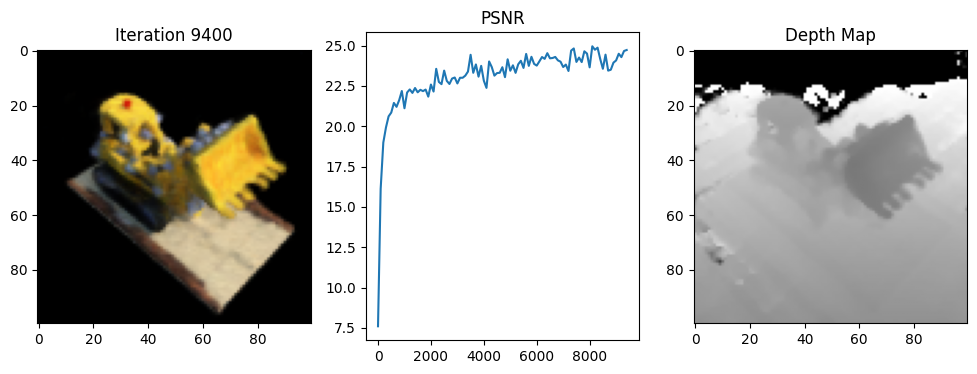

 95%|█████████▍| 9499/10000 [14:22<00:38, 13.03it/s]

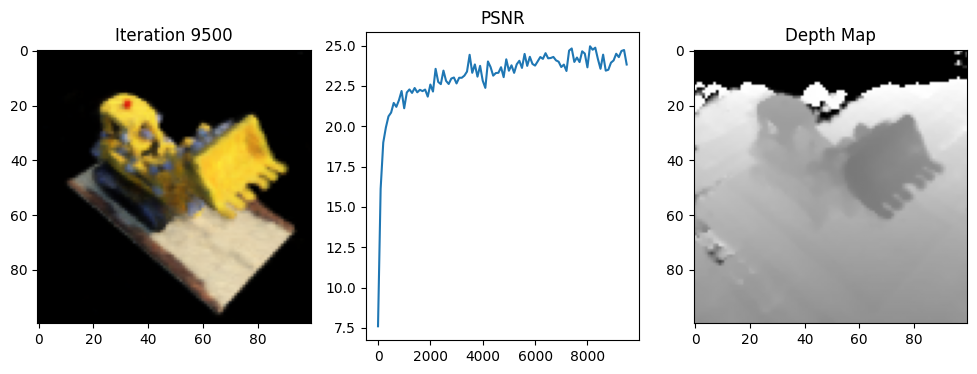

 96%|█████████▌| 9599/10000 [14:31<00:30, 13.11it/s]

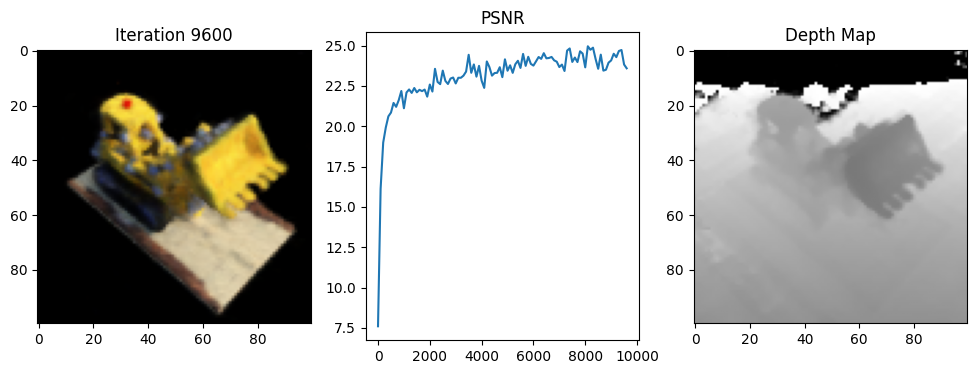

 97%|█████████▋| 9699/10000 [14:40<00:23, 12.82it/s]

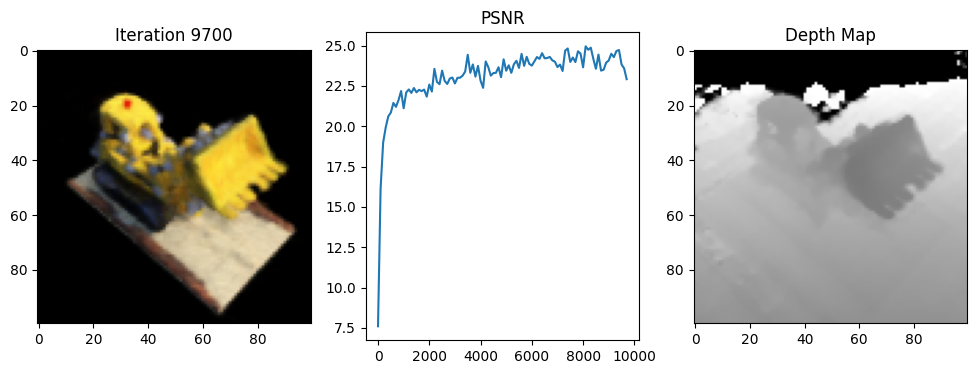

 98%|█████████▊| 9799/10000 [14:49<00:15, 13.12it/s]

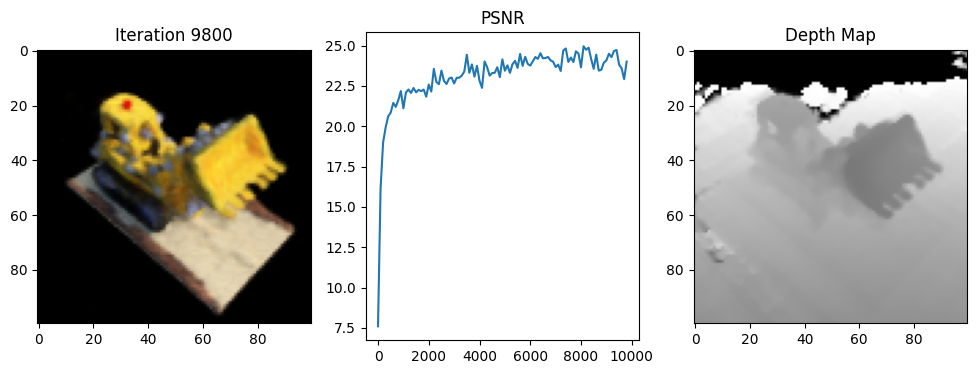

 99%|█████████▉| 9899/10000 [14:59<00:07, 13.07it/s]

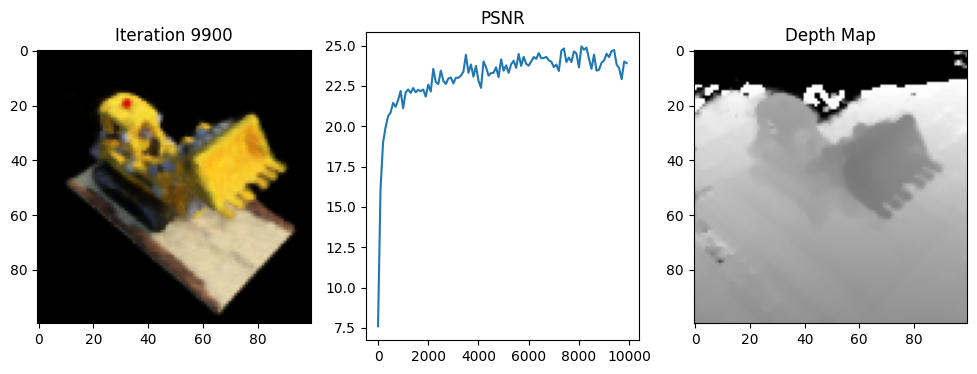

100%|██████████| 10000/10000 [15:08<00:00, 11.01it/s]


Done
Video save start


100%|██████████| 120/120 [00:05<00:00, 22.86it/s]


Done


In [ ]:
def posenc(x):
    """
    Positional encoding
    """
    rets = [x]
    for i in range(L_embed):
        for fn in [torch.sin, torch.cos]:
            rets.append(fn(2.0 ** i * x))
    return torch.cat(rets, dim=-1)

embed_fn = posenc

def get_rays(H, W, focal, c2w):
    """
    Get ray origin, direction to each image pixels based on camera pose
    """
    def meshgrid_xy(tensor1, tensor2):
        i, j = torch.meshgrid(tensor1, tensor2, indexing="ij")
        return i.transpose(-1, -2), j.transpose(-1, -2)

    i, j = meshgrid_xy(
        torch.arange(W, dtype=torch.float32).to(device),
        torch.arange(H, dtype=torch.float32).to(device)
    )
    dirs = torch.stack([(i-W*0.5)/focal, -(j-H*0.5)/focal, -torch.ones_like(i).to(device)], dim=-1).to(device)
    rays_d = torch.sum(dirs[..., None, :].to(device) * c2w[:3, :3].to(device), dim=-1)
    rays_o = c2w[:3, -1].expand(rays_d.shape)
    return rays_o.to(device), rays_d.to(device)

def render_rays(network_fn, rays_o, rays_d, near, far, N_samples, rand=False):
    """
    Volume rendering
    """
    def batchify(fn, chunk=1024*32):
        return lambda inputs : torch.cat([fn(inputs[i:i+chunk]) for i in range(0, inputs.shape[0], chunk)], dim=0)

    def exclusive_cumprod(tensor):
        cumprod = torch.cumprod(tensor, dim=-1)
        cumprod = torch.roll(cumprod, 1, dims=-1)
        cumprod[..., 0] = 1.0
        return cumprod

    # Compute 3D query points
    z_vals = torch.linspace(near, far, N_samples).to(device)
    if rand:
        z_vals = z_vals + torch.rand(list(rays_o.shape[:-1]) + [N_samples]).to(device) * (far-near)/N_samples
    pts = rays_o[..., None, :] + rays_d[..., None, :] * z_vals[..., :, None]

    # Run network
    pts_flat = torch.reshape(pts, [-1, 3])
    pts_flat = embed_fn(pts_flat)
    raw = batchify(network_fn)(pts_flat)
    raw = torch.reshape(raw, list(pts.shape[:-1]) + [4])

    # Compute opacities and color
    sigma_a = torch.nn.functional.relu(raw[..., 3])
    rgb = torch.sigmoid(raw[..., :3])

    # Do volume rendering
    dists = torch.cat([z_vals[..., 1:] - z_vals[..., :-1], torch.tensor([1e10], device=device).expand(z_vals[..., :1].shape)], dim=-1)
    alpha = 1.0 - torch.exp(-sigma_a * dists)
    weights = alpha * exclusive_cumprod(1.0-alpha + 1e-10)
    rgb_map = torch.sum(weights[..., None] * rgb, dim=-2)
    depth_map = torch.sum(weights * z_vals, dim=-1)
    acc_map = torch.sum(weights, dim=-1)

    return rgb_map, depth_map, acc_map

if __name__ == "__main__":
    data = np.load('tiny_nerf_data.npz')
    images = data['images']
    poses = data['poses']
    focal = data['focal']

    images = torch.from_numpy(images).to(device)
    poses = torch.from_numpy(poses).to(device)
    focal = torch.from_numpy(focal).to(device)

    H, W = images.shape[1:3]

    # Define test set, training set
    testimg, testpose = images[101], poses[101]
    images = images[:100,...,:3]
    poses = poses[:100]

    # Hyperparameters
    N_samples = 64
    N_iters = 10000
    psnrs = []
    iternums = []
    i_plot = 100
    lr = 5e-3

    # Define NeRF model, optimizer
    model = NeRF()
    model = model.to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    # NeRF optimization loop
    print("NeRF optimization start")
    plot_image = True

    for i in tqdm(range(N_iters)):
        img_i = np.random.randint(images.shape[0])
        target = images[img_i].to(device)
        pose = poses[img_i].to(device)
        rays_o, rays_d = get_rays(H, W, focal, pose)
        rgb, depth, acc = render_rays(model, rays_o, rays_d, near=2.0, far=6.0, N_samples=N_samples, rand=True)

        # Back propagation
        loss = torch.nn.functional.mse_loss(rgb, target)
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()

        if plot_image:
            if i % i_plot == 0:
                rays_o, rays_d = get_rays(H, W, focal, testpose)
                rgb, depth, acc = render_rays(model, rays_o, rays_d, near=2.0, far=6.0, N_samples=N_samples)
                loss = torch.nn.functional.mse_loss(rgb, testimg)
                psnr = -10.0 * torch.log10(loss)

                psnrs.append(psnr.item())
                iternums.append(i)

                plt.figure(figsize=(12, 4))
                plt.subplot(131)
                plt.imshow(rgb.cpu().detach().numpy())
                plt.title(f"Iteration {i}")
                plt.subplot(132)
                plt.plot(iternums, psnrs)
                plt.title("PSNR")
                plt.subplot(133)
                plt.imshow(depth.cpu().detach().numpy(), cmap="gray")
                plt.title("Depth Map")

                # Auto close
                plt.show(block=False)
                plt.pause(1)
                plt.close()

    print("Done")

    save_video = True
    if save_video:
        print("Video save start")
        import imageio

        trans_t = lambda t : np.array([
            [1, 0, 0, 0],
            [0, 1, 0, 0],
            [0, 0, 1, t],
            [0, 0, 0, 1]
        ], dtype=np.float32)

        rot_phi = lambda phi : np.array([
            [1, 0, 0, 0],
            [0, np.cos(phi), -np.sin(phi), 0],
            [0, np.sin(phi), np.cos(phi), 0],
            [0, 0, 0, 1]
        ], dtype=np.float32)

        rot_theta = lambda th : np.array([
            [np.cos(th), 0, -np.sin(th), 0],
            [0, 1, 0, 0],
            [np.sin(th), 0, np.cos(th), 0],
            [0, 0, 0, 1]
        ], dtype=np.float32)

        def pose_spherical(theta, phi, radius):
            c2w = trans_t(radius)
            c2w = rot_phi(phi/180.0*np.pi) @ c2w
            c2w = rot_theta(theta/180.0*np.pi) @ c2w
            c2w = np.array([[-1,0,0,0],[0,0,1,0],[0,1,0,0],[0,0,0,1]]) @ c2w
            return torch.from_numpy(c2w).float().to(device)

        frames = []

        for th in tqdm(np.linspace(0.0, 360.0, 120, endpoint=False)):
            c2w = pose_spherical(th, -30.0, 4.0)
            rays_o, rays_d = get_rays(H, W, focal, c2w[:3,:4])
            rgb, depth, acc = render_rays(model, rays_o, rays_d, near=2.0, far=6.0, N_samples=N_samples)
            rgb = rgb.detach().cpu().numpy()
            frames.append((255*np.clip(rgb,0,1)).astype(np.uint8))

        f = 'video.mp4'
        imageio.mimwrite(f, frames, fps=30, quality=7)
        print("Done")

Done
